# CSE252C: Homework 1
## Computing Resources
Please read the README file of this repository for the instructions
## Instructions
1. Attempt all questions.
2. Please comment all your code adequately.
3. Include all relevant information such as text answers, output images in notebook.
4. **Academic integrity:** The homework must be completed individually.

5. **Submission instructions:**  
 (a) Submit the notebook and its PDF version on Gradescope.  
 (b) Rename your submission files as Lastname_Firstname.ipynb and Lastname_Firstname.pdf.  
 (c) Correctly select pages for each answer on Gradescope to allow proper grading.

6. **Due date:** Assignments are due Mon, May 4, by 4pm PST.

## Question 1: Warm Up

We will first try SFM using the original implementation from $\mathtt{libviso2}$[8],[9]. We will test on a dataset containing 300 images from one sequence of the KITTI dataset with ground-truth camera poses and camera calibration information. 

Run the SFM algorithm using the following script. You are required to report two error metrics. The error metric for rotation is defined as the mean of Frobenius norm of the difference between the ground-truth rotation matrix and predicted rotation matrix. The error metric for translation is defined as mean of the L2 distance. Both errors will be printed on the screen as you run the code.  **(5 points)**

In [2]:
import os
import sys
# change your base path
os.chdir('./pyviso/') # './'
print(os.getcwd())

/Users/QV/code-project/hw/spring2019/cse252c/cse252c_hw1/pyviso


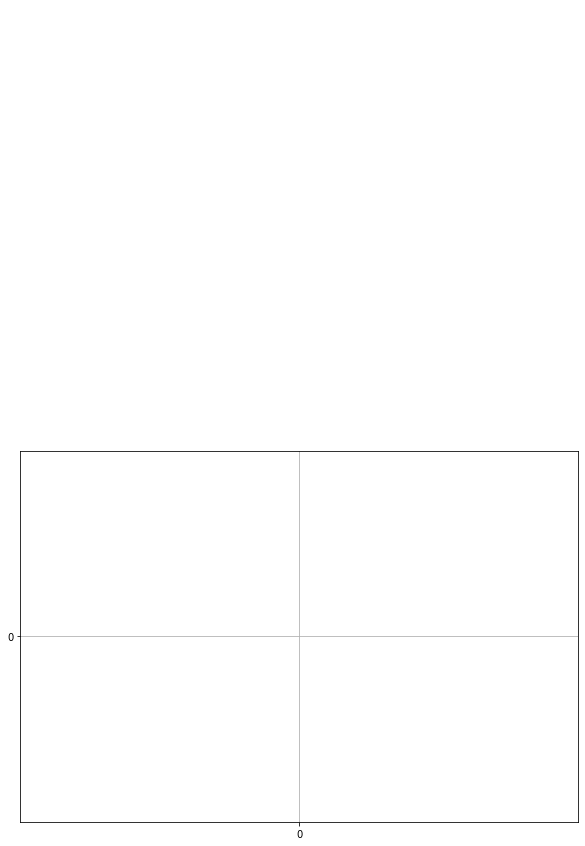

In [6]:
import os
import numpy as np
np.set_printoptions(precision=4)
np.set_printoptions(suppress=True)
import viso2
import matplotlib.pyplot as plt
from skimage.io import imread
import time

def errorMetric(RPred, RGt, TPred, TGt):
    diffRot = (RPred - RGt)
    diffTrans = (TPred - TGt)
    errorRot = np.sqrt(np.sum(np.multiply(diffRot.reshape(-1), diffRot.reshape(-1))))
    errorTrans = np.sqrt(np.sum(np.multiply(diffTrans.reshape(-1), diffTrans.reshape(-1))))

    return errorRot, errorTrans

if_vis = True # set to True to do the visualization per frame; the images will be saved at '.vis/'. Turn off if you just want the camera poses and errors
if_on_screen = False # if True the visualization per frame is going to be displayed realtime on screen; if False there will be no display, but in both options the images will be saved

# parameter settings (for an example, please download
# dataset_path = '../dataset'
dataset_path = '/Users/QV/code-project/datasets/dataset_SfM' # On the ``ieng6.ucsd.edu`` server
img_dir      = os.path.join(dataset_path, 'sequences/00/image_0')
gt_dir       = os.path.join(dataset_path, 'poses/00.txt')
calibFile    = os.path.join(dataset_path, 'sequences/00/calib.txt')
border       = 50
gap          = 15

# Load the camera calibration information
with open(calibFile) as fid:
    calibLines = fid.readlines()
    calibLines = [calibLine.strip() for calibLine in calibLines]

calibInfo = [float(calibStr) for calibStr in calibLines[0].split(' ')[1:]]
# param = {'f': calibInfo[0], 'cu': calibInfo[2], 'cv': calibInfo[6]}

# Load the ground-truth depth and rotation
with open(gt_dir) as fid:
    gtTr = [[float(TrStr) for TrStr in line.strip().split(' ')] for line in fid.readlines()]
gtTr = np.asarray(gtTr).reshape(-1, 3, 4)

# param['height'] = 1.6
# param['pitch']  = -0.08
# param['match'] = {'pre_step_size': 64}
first_frame  = 0
last_frame   = 300
epi = 1e-8

# init visual odometry
params = viso2.Mono_parameters()
params.calib.f = calibInfo[0]
params.calib.cu = calibInfo[2]
params.calib.cv = calibInfo[6]
params.height = 1.6
params.pitch = -0.08


first_frame  = 0
last_frame   = 300

# init transformation matrix array
Tr_total = []
Tr_total_np = []
Tr_total.append(viso2.Matrix_eye(4))
Tr_total_np.append(np.eye(4))

# init viso module
visoMono = viso2.VisualOdometryMono(params)

if if_vis:
    save_path = 'vis'
    os.makedirs(save_path, exist_ok=True)

    # create figure
    fig = plt.figure(figsize=(10, 15))
    ax1 = plt.subplot(211)
    ax1.axis('off')
    ax2 = plt.subplot(212)
    ax2.set_xticks(np.arange(-100, 100, step=10))
    ax2.set_yticks(np.arange(-500, 500, step=10))
    ax2.axis('equal')
    ax2.grid()
    if if_on_screen:
        plt.ion()
    else:
        plt.ioff()

Mean Error Rotation: 6947558.55240
Mean Error Translation: 9718750861.05217
== [Result] Frame: 0, Matches 0, Inliers: 0.00
Saved at vis/frame000.jpg


<Figure size 432x288 with 0 Axes>

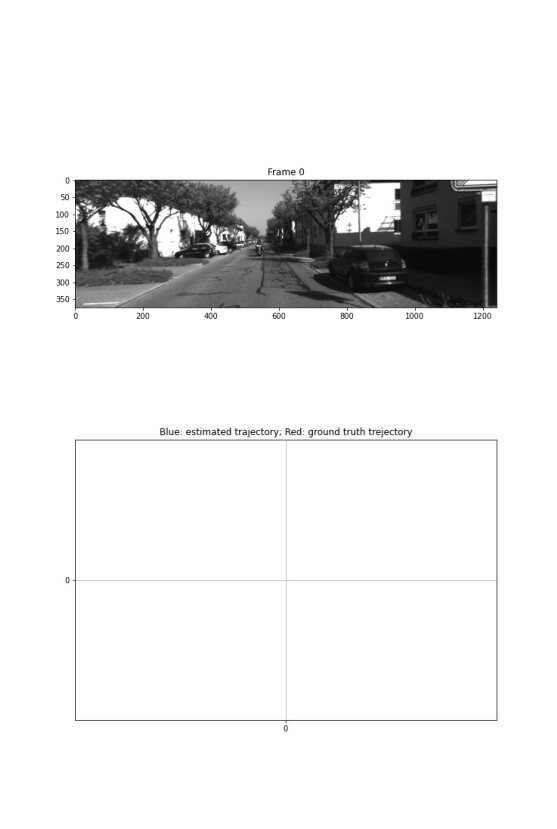

[[ 1.     -0.0016 -0.003  -0.0052]
 [ 0.0016  1.     -0.0021 -0.0045]
 [ 0.003   0.0021  1.      0.4767]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.07306
Mean Error Translation: 97.57250
== [Result] Frame: 1, Matches 320, Inliers: 89.69
Saved at vis/frame001.jpg
[[ 1.     -0.0011 -0.0079 -0.0057]
 [ 0.0011  1.     -0.0036 -0.0085]
 [ 0.0079  0.0036  1.      0.9479]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.03858
Mean Error Translation: 48.98120
== [Result] Frame: 2, Matches 325, Inliers: 83.38
Saved at vis/frame002.jpg
[[ 0.9999 -0.0021 -0.0123 -0.0119]
 [ 0.002   1.     -0.0046 -0.0159]
 [ 0.0123  0.0046  0.9999  1.4281]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.02701
Mean Error Translation: 32.78121
== [Result] Frame: 3, Matches 329, Inliers: 83.59
Saved at vis/frame003.jpg
[[ 0.9998 -0.0029 -0.0179 -0.0188]
 [ 0.0028  1.     -0.0051 -0.0207]
 [ 0.018   0.0051  0.9998  1.9135]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0

<Figure size 432x288 with 0 Axes>

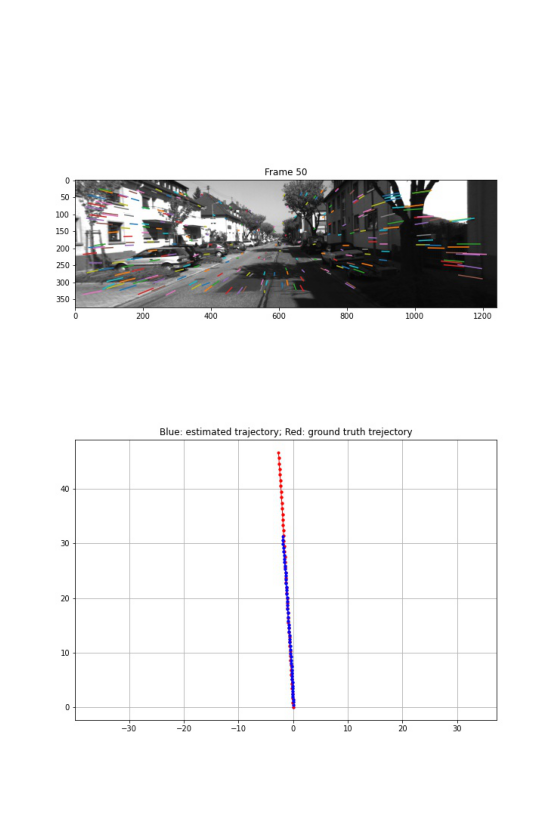

[[ 0.9968 -0.0017 -0.0796 -1.9944]
 [ 0.0019  1.      0.003  -0.3848]
 [ 0.0796 -0.0031  0.9968 32.0799]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00392
Mean Error Translation: 2.21133
== [Result] Frame: 51, Matches 283, Inliers: 72.08
Saved at vis/frame051.jpg
[[ 0.9968  0.0006 -0.0798 -2.0623]
 [-0.0007  1.     -0.0005 -0.3961]
 [ 0.0798  0.0006  0.9968 32.8262]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00388
Mean Error Translation: 2.17343
== [Result] Frame: 52, Matches 300, Inliers: 78.33
Saved at vis/frame052.jpg
[[ 0.9967 -0.0001 -0.0815 -2.1202]
 [-0.0003  1.     -0.0047 -0.4068]
 [ 0.0815  0.0047  0.9967 33.5696]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00386
Mean Error Translation: 2.13686
== [Result] Frame: 53, Matches 307, Inliers: 79.48
Saved at vis/frame053.jpg
[[ 0.9966  0.0007 -0.0819 -2.1945]
 [-0.0012  1.     -0.006  -0.4195]
 [ 0.0819  0.0061  0.9966 34.336 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0

<Figure size 432x288 with 0 Axes>

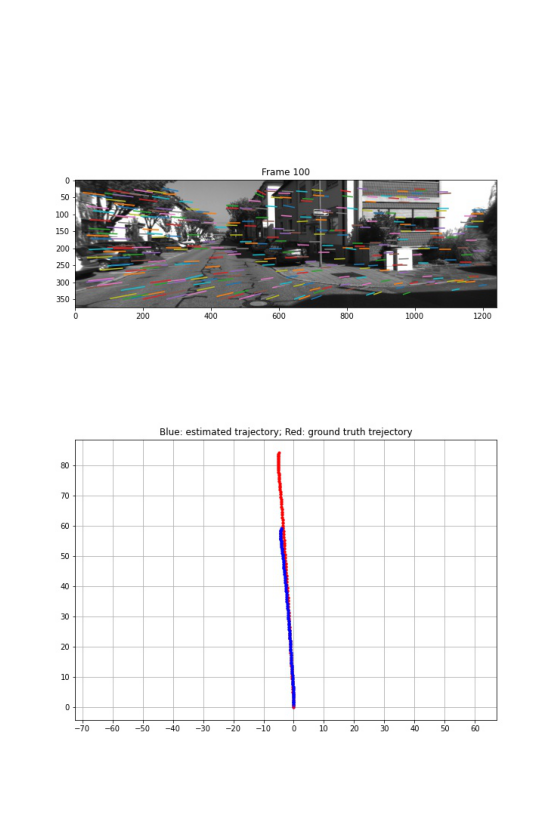

[[ 0.9853 -0.0343  0.1676 -4.0781]
 [ 0.0336  0.9994  0.007  -0.8612]
 [-0.1678 -0.0012  0.9858 59.5674]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00352
Mean Error Translation: 1.21284
== [Result] Frame: 101, Matches 330, Inliers: 87.58
Saved at vis/frame101.jpg
[[ 0.976  -0.0357  0.215  -3.9673]
 [ 0.0351  0.9994  0.0065 -0.8641]
 [-0.215   0.0012  0.9766 59.8724]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00353
Mean Error Translation: 1.20183
== [Result] Frame: 102, Matches 336, Inliers: 91.07
Saved at vis/frame102.jpg
[[ 0.9631 -0.0359  0.2668 -3.8471]
 [ 0.0355  0.9993  0.0061 -0.8687]
 [-0.2669  0.0036  0.9637 60.1591]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00351
Mean Error Translation: 1.19120
== [Result] Frame: 103, Matches 342, Inliers: 87.72
Saved at vis/frame103.jpg
[[ 0.9459 -0.0373  0.3224 -3.7171]
 [ 0.0372  0.9993  0.0066 -0.8702]
 [-0.3224  0.0057  0.9466 60.4345]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation

<Figure size 432x288 with 0 Axes>

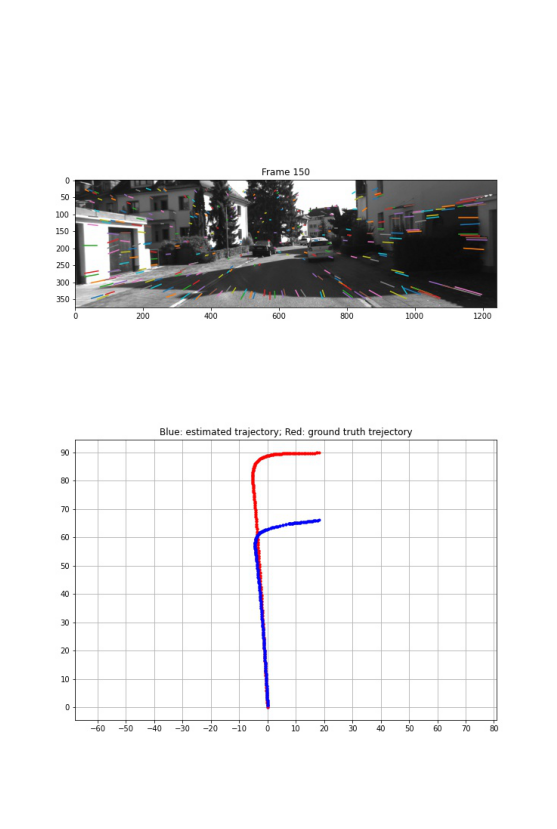

[[ 0.1399 -0.047   0.989  18.8235]
 [ 0.1033  0.9941  0.0326 -0.1509]
 [-0.9848  0.0976  0.1439 66.1769]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00333
Mean Error Translation: 0.87360
== [Result] Frame: 151, Matches 264, Inliers: 78.03
Saved at vis/frame151.jpg
[[ 0.1423 -0.0418  0.9889 19.4104]
 [ 0.0981  0.9948  0.028  -0.1416]
 [-0.985   0.093   0.1456 66.2658]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00333
Mean Error Translation: 0.86935
== [Result] Frame: 152, Matches 271, Inliers: 78.60
Saved at vis/frame152.jpg
[[ 0.1431 -0.0385  0.989  19.993 ]
 [ 0.0964  0.995   0.0247 -0.1272]
 [-0.985   0.0918  0.1461 66.3498]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00332
Mean Error Translation: 0.86523
== [Result] Frame: 153, Matches 280, Inliers: 79.29
Saved at vis/frame153.jpg
[[ 0.146  -0.0391  0.9885 20.6106]
 [ 0.0977  0.9949  0.025  -0.1153]
 [-0.9845  0.0929  0.1491 66.4224]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation

<Figure size 432x288 with 0 Axes>

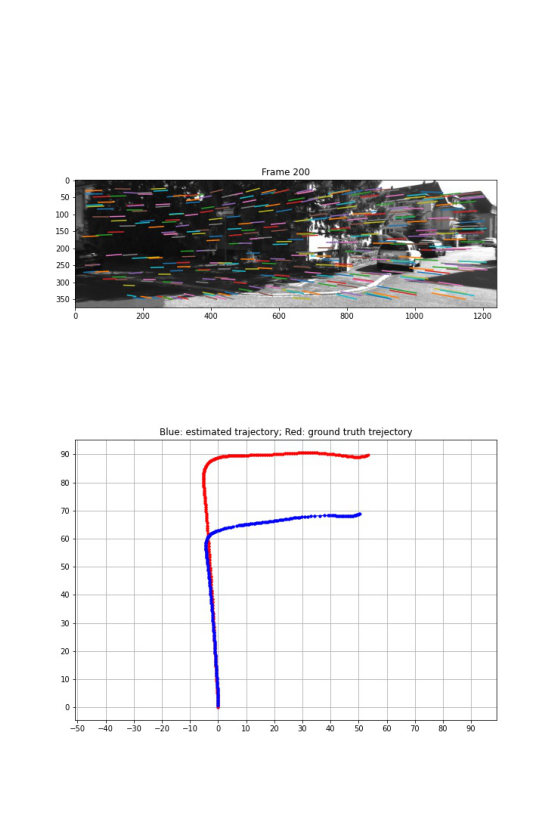

[[ 0.4111 -0.0419  0.9106 50.8244]
 [ 0.0793  0.9968  0.01    0.4341]
 [-0.9081  0.0681  0.4131 69.1304]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00306
Mean Error Translation: 0.71488
== [Result] Frame: 201, Matches 352, Inliers: 85.80
Saved at vis/frame201.jpg
[[ 0.4645 -0.0397  0.8847 51.128 ]
 [ 0.0805  0.9968  0.0025  0.4304]
 [-0.8819  0.07    0.4662 69.3399]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00307
Mean Error Translation: 0.71204
== [Result] Frame: 202, Matches 343, Inliers: 83.67
Saved at vis/frame202.jpg
[[ 0.5185 -0.0367  0.8543 51.4098]
 [ 0.0816  0.9966 -0.0067  0.4142]
 [-0.8512  0.0732  0.5198 69.5797]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00307
Mean Error Translation: 0.70916
== [Result] Frame: 203, Matches 332, Inliers: 75.60
Saved at vis/frame203.jpg
[[ 0.5714 -0.0312  0.8201 51.6674]
 [ 0.0803  0.9966 -0.0181  0.4021]
 [-0.8168  0.0762  0.5719 69.8464]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation

<Figure size 432x288 with 0 Axes>

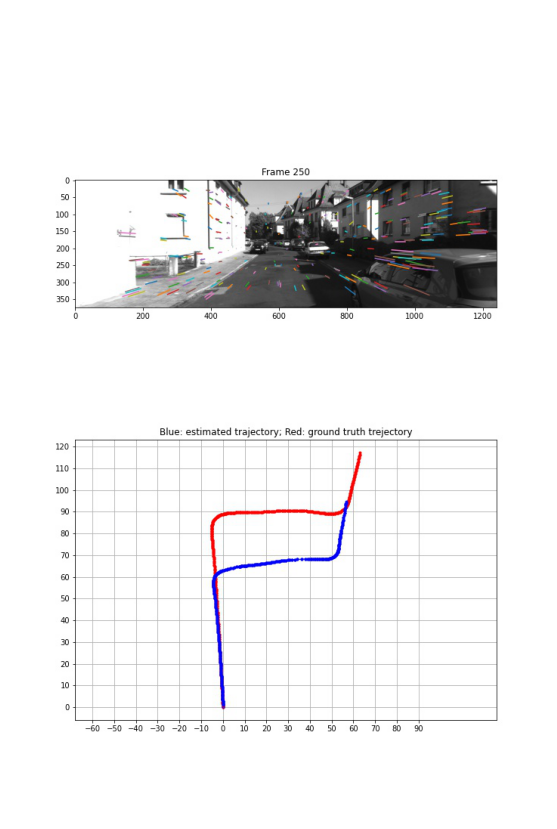

[[ 0.9841  0.0298  0.175  56.833 ]
 [-0.0191  0.9978 -0.0629 -1.2136]
 [-0.1765  0.0586  0.9826 95.2742]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00301
Mean Error Translation: 0.60425
== [Result] Frame: 251, Matches 255, Inliers: 72.94
Saved at vis/frame251.jpg
[[ 0.9841  0.034   0.1743 56.9356]
 [-0.0228  0.9976 -0.0654 -1.2622]
 [-0.1761  0.0604  0.9825 95.835 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00301
Mean Error Translation: 0.60294
== [Result] Frame: 252, Matches 276, Inliers: 76.09
Saved at vis/frame252.jpg
[[ 0.9838  0.0417  0.1743 57.0388]
 [-0.0304  0.9973 -0.067  -1.3059]
 [-0.1766  0.0606  0.9824 96.4172]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00300
Mean Error Translation: 0.60158
== [Result] Frame: 253, Matches 274, Inliers: 81.02
Saved at vis/frame253.jpg
[[ 0.9829  0.0482  0.1776 57.1305]
 [-0.0369  0.9971 -0.0666 -1.3494]
 [-0.1803  0.0589  0.9819 97.0097]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation

<Figure size 432x288 with 0 Axes>

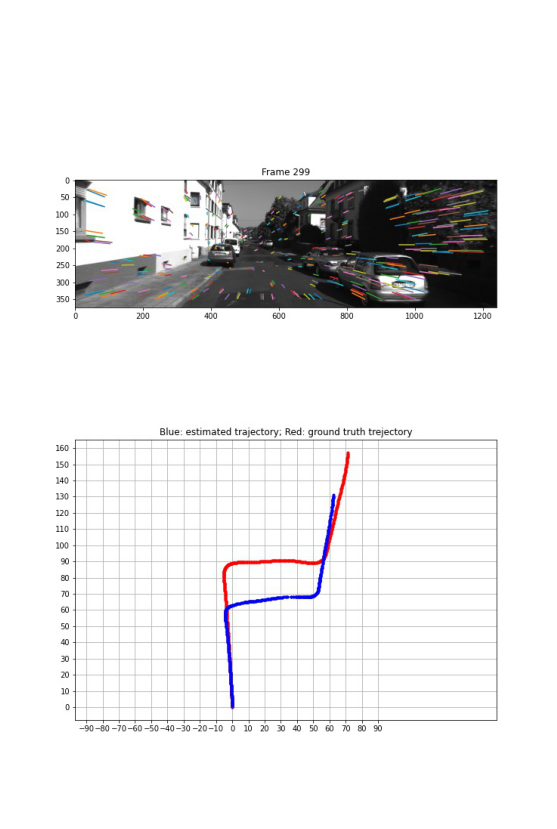

In [8]:
# for all frames do
if_replace = False
errorTransSum = 0
errorRotSum = 0
errorRot_list = []
errorTrans_list =[]

for frame in range(first_frame, last_frame):
    # 1-based index
    k = frame-first_frame+1

    # read current images
    I = imread(os.path.join(img_dir, '%06d.png'%frame))
    assert(len(I.shape) == 2) # should be grayscale

    # compute egomotion
    process_result = visoMono.process_frame(I, if_replace)
    Tr = visoMono.getMotion()
    matrixer = viso2.Matrix(Tr)
    Tr_np = np.zeros((4, 4))
    Tr.toNumpy(Tr_np) # so awkward...

    # accumulate egomotion, starting with second frame
    if k > 1:
        if process_result is False:
            if_replace = True
            Tr_total.append(Tr_total[-1])
            Tr_total_np.append(Tr_total_np[-1])
        else:
            if_replace = False
            Tr_total.append(Tr_total[-1] * viso2.Matrix_inv(Tr))
            Tr_total_np.append(Tr_total_np[-1] @ np.linalg.inv(Tr_np)) # should be the same
            print(Tr_total_np[-1])

    # output statistics
    num_matches = visoMono.getNumberOfMatches()
    num_inliers = visoMono.getNumberOfInliers()
    matches = visoMono.getMatches()
    matches_np = np.empty([4, matches.size()])

    for i,m in enumerate(matches):
        matches_np[:, i] = (m.u1p, m.v1p, m.u1c, m.v1c)

    if if_vis:
        # update image
        ax1.clear()
        ax1.imshow(I, cmap='gray', vmin=0, vmax=255)
        if num_matches != 0:
            for n in range(num_matches):
                ax1.plot([matches_np[0, n], matches_np[2, n]], [matches_np[1, n], matches_np[3, n]])
        ax1.set_title('Frame %d'%frame)

        # update trajectory
        if k > 1:
            ax2.plot([Tr_total_np[k-2][0, 3], Tr_total_np[k-1][0, 3]], \
                [Tr_total_np[k-2][2, 3], Tr_total_np[k-1][2, 3]], 'b.-', linewidth=1)
            ax2.plot([gtTr[k-2][0, 3], gtTr[k-1][0, 3]], \
                [gtTr[k-2][2, 3], gtTr[k-1][2, 3]], 'r.-', linewidth=1)
        ax2.set_title('Blue: estimated trajectory; Red: ground truth trejectory')

        plt.draw()

    # Compute rotation
    Rpred_p = Tr_total_np[k-2][0:3, 0:3]
    Rpred_c = Tr_total_np[k-1][0:3, 0:3]
    Rpred = Rpred_c.transpose() @ Rpred_p
    Rgt_p = np.squeeze(gtTr[k-2, 0:3, 0:3])
    Rgt_c = np.squeeze(gtTr[k-1, 0:3, 0:3])
    Rgt = Rgt_c.transpose() @ Rgt_p
    # Compute translation
    Tpred_p = Tr_total_np[k-2][0:3, 3:4]
    Tpred_c = Tr_total_np[k-1][0:3, 3:4]
    Tpred = Tpred_c - Tpred_p
    Tgt_p = gtTr[k-2, 0:3, 3:4]
    Tgt_c = gtTr[k-1, 0:3, 3:4]
    Tgt = Tgt_c - Tgt_p
    # Compute errors
    errorRot, errorTrans = errorMetric(Rpred, Rgt, Tpred, Tgt)
    errorRotSum = errorRotSum + errorRot
    errorTransSum = errorTransSum + errorTrans
    # errorRot_list.append(errorRot)
    # errorTrans_list.append(errorTrans)
    print('Mean Error Rotation: %.5f'%(errorRotSum / (k-1+epi)))
    print('Mean Error Translation: %.5f'%(errorTransSum / (k-1+epi)))



    print('== [Result] Frame: %d, Matches %d, Inliers: %.2f'%(frame, num_matches, 100*num_inliers/(num_matches+1e-8)))

    if if_vis:
        # input('Paused; Press Enter to continue') # Option 1: Manually pause and resume
        if if_on_screen:
            plt.pause(0.1) # Or Option 2: enable to this to auto pause for a while after daring to enable animation in case of a delay in drawing
        vis_path = os.path.join(save_path, 'frame%03d.jpg'%frame)
        fig.savefig(vis_path)
        print('Saved at %s'%vis_path)
        
        if frame % 50 == 0 or frame == last_frame-1:
            plt.figure(figsize=(10, 15))
            plt.imshow(plt.imread(vis_path))
            plt.axis('off')
            plt.show()


# input('Press Enter to exit')

1. Report the final rotation and translation error. **(2 points)**

Mean Error Rotation: 0.00299

Mean Error Translation: 0.53948

Then answer the questions below

2. In $\mathtt{libviso2}$, the feature points are "bucketed" ($\mathtt{src/matcher.cpp: Line 285 - 326}$), which means in a certain area of region, the number of detected keypoint pairs should be within certain bounds. Why?  **(3 points)**

As discussed in the paper, this has two effects:

- It reduces the computational complexity since the number of points are upper-bounded. This allows for real-time SfM.

- The feature points are more even distributed over the image, instead of being concentrated in regions with diverse features, such as objects. This will remove drift over time.

3. We have run SFM on a single camera, which means the scale of translation is unknown. However, as you may have observed, the predicted trajectory is still somehow similar to the ground-truth trajectory. How does $\mathtt{libviso2}$ handle this ambiguity ($\mathtt{viso\_mono.cpp: Line 245}$)?  **(5 points)**

In this question, we are given frames taken by the same camera. We then obtain matches in both frames and then estimate the fundamental matrix and the translation and rotation of the camera between the two frames. This leads to scale ambiguity in the translation.

The way libviso2 handles this is by normalizing t: t = t * param.height / d.val[0][best_idx];

From the code, param.height seems to be a pre-defined value (1.6). This is supposed to be the height of the camera. 

d is a (1, X_plane.n) matrix where X_plane.n is the number of matched points. 

From the c++ code, it seems they first project the feature points into a 2d plane that passes through at least one feature point. They pick the best plane to be the plane that minimizes the sum of exponential of negative difference. 

It is most likely that this plane is the ground plane. 

Thus, to normalize t, they multiple t by the height of the camera and divide by the height of the ground.

4. Briefly explain the RANSAC algorithm used in $\mathtt{libviso2}$ ($\mathtt{viso\_mono.cpp: Line 113 - 129}$).  **(5 points)**

The algorithm runs for param.ransac_iters iteration. In each iteration, 8 correspondences are sampled out of the N available correspondences. A fundamental matrix is estimated from these 8 points and the number of inliers (correspondences satisfying the homogenous constraints for a given fundamental matrix) is computed.

In each iteration, we keep track of the maximum number of inliners that fit a particular estimate of the fundamental matrix.

## Question 2: Using SIFT [4] for SFM

In the second task, you are required to use keypoints and feature descriptors from SIFT for SFM. The SIFT implementation can be found in directory $\mathtt{SIFT}$. 

(A) Go to $\mathtt{SIFT}$ directory and run $\mathtt{runSIFT.py}$ (e.g. `python runSIFT.py --input /datasets/cse152-252-sp20-public/dataset_SfM/sequences/00/image_0/`). You will save the detected keypoints and feature descriptors under the directory $\mathtt{SIFT}$. For image $\mathtt{000abc.png}$, the pre-computed features and keypoints should be saved in a $\mathtt{.npy}$ file named as $\mathtt{000abc\_feature.npy}$. The variable should be a $130 \times N$ matrix with $\mathtt{single}$ precision, where $N$ is the number of feature points being detected. For each $130$-dimensional feature vector, the first two dimensions are the location of the keypoints (column number first and then row number) on the image plane and the last $128$ dimensions are the feature descriptor. 

(B) Run the following script

Mean Error Rotation: inf
Mean Error Translation: inf
== [Result] Frame: 0, Matches 0, Inliers: 0.00
Saved at vis_preFeature/frame000.jpg


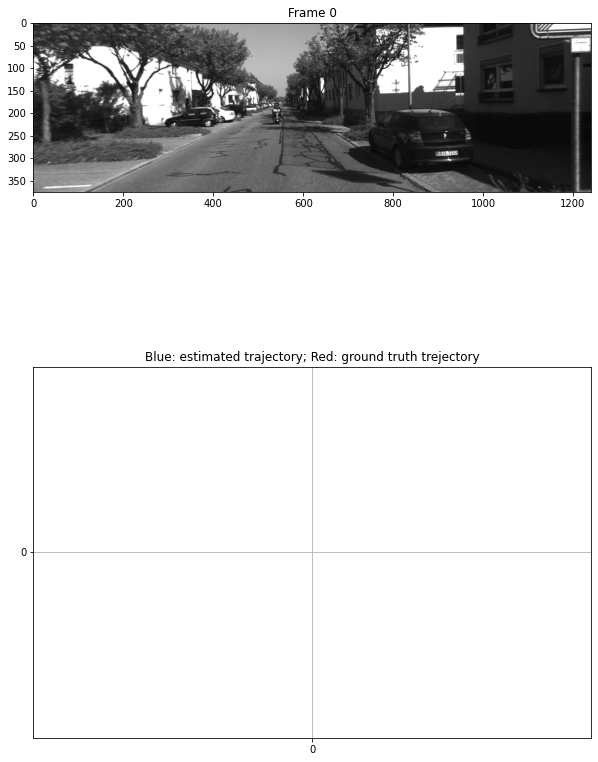

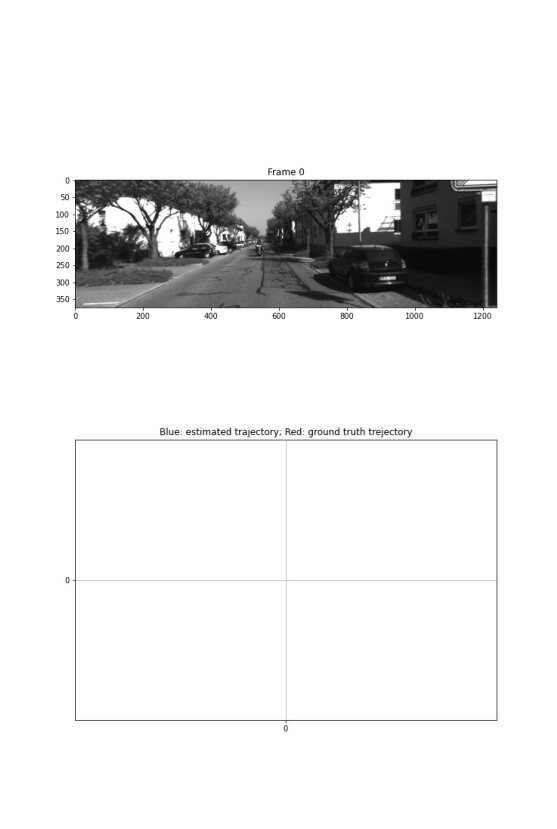

[[ 1.     -0.0044 -0.0041  0.0058]
 [ 0.0044  1.     -0.0021 -0.0028]
 [ 0.0041  0.0021  1.      0.464 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.07711
Mean Error Translation: 97.58649
== [Result] Frame: 1, Matches 282, Inliers: 74.82
Saved at vis_preFeature/frame001.jpg
[[ 1.     -0.0038 -0.009   0.0047]
 [ 0.0037  1.     -0.0035 -0.0058]
 [ 0.009   0.0035  1.      0.9229]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.04056
Mean Error Translation: 48.99429
== [Result] Frame: 2, Matches 281, Inliers: 77.22
Saved at vis_preFeature/frame002.jpg
[[ 0.9999 -0.0042 -0.013  -0.004 ]
 [ 0.0041  1.     -0.005  -0.0084]
 [ 0.013   0.0049  0.9999  1.3977]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.02805
Mean Error Translation: 32.79175
== [Result] Frame: 3, Matches 292, Inliers: 76.71
Saved at vis_preFeature/frame003.jpg
[[ 0.9998 -0.0021 -0.0177 -0.0197]
 [ 0.002   1.     -0.0057 -0.0132]
 [ 0.0177  0.0056  0.9998  1.8773]
 [ 0.      0.      0.    

<Figure size 432x288 with 0 Axes>

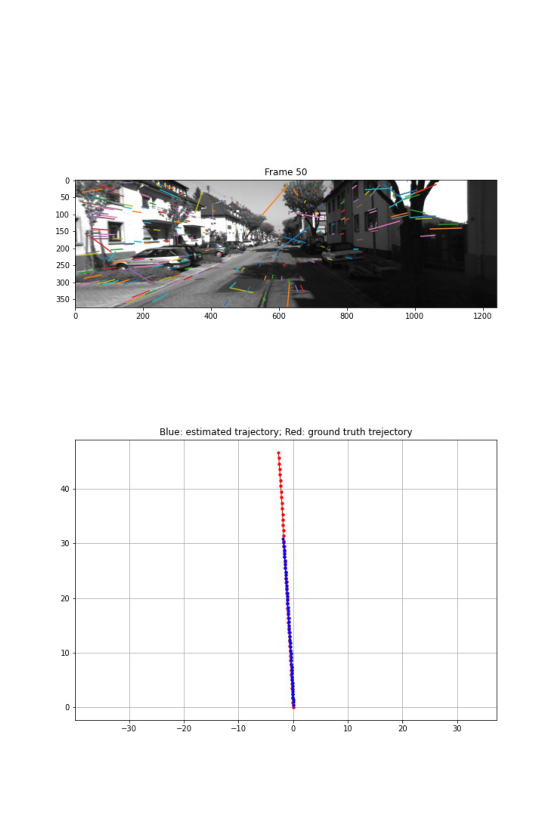

[[ 0.9973 -0.0035 -0.0733 -1.8813]
 [ 0.0039  1.      0.005  -0.3347]
 [ 0.0733 -0.0053  0.9973 31.5759]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00362
Mean Error Translation: 2.22132
== [Result] Frame: 51, Matches 247, Inliers: 76.52
Saved at vis_preFeature/frame051.jpg
[[ 0.9972 -0.0024 -0.0746 -1.9274]
 [ 0.0025  1.      0.0013 -0.3451]
 [ 0.0746 -0.0015  0.9972 32.2956]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00361
Mean Error Translation: 2.18377
== [Result] Frame: 52, Matches 242, Inliers: 75.62
Saved at vis_preFeature/frame052.jpg
[[ 0.9971 -0.0019 -0.0755 -1.9887]
 [ 0.0017  1.     -0.0027 -0.3534]
 [ 0.0755  0.0026  0.9971 33.0334]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00358
Mean Error Translation: 2.14711
== [Result] Frame: 53, Matches 257, Inliers: 78.60
Saved at vis_preFeature/frame053.jpg
[[ 0.9971 -0.0021 -0.0766 -2.0474]
 [ 0.0018  1.     -0.0044 -0.359 ]
 [ 0.0766  0.0043  0.9971 33.7851]
 [ 0.      0.      0.    

<Figure size 432x288 with 0 Axes>

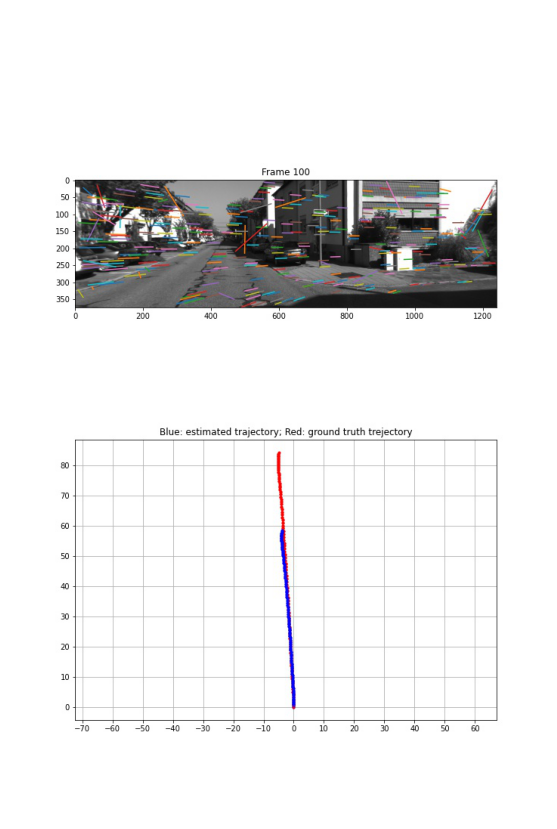

[[ 0.9818 -0.0148  0.1893 -3.7669]
 [ 0.0145  0.9999  0.0027 -0.7293]
 [-0.1893  0.0001  0.9819 58.8696]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00278
Mean Error Translation: 1.21977
== [Result] Frame: 101, Matches 304, Inliers: 84.87
Saved at vis_preFeature/frame101.jpg
[[ 0.9712 -0.0135  0.2379 -3.664 ]
 [ 0.0135  0.9999  0.0017 -0.7348]
 [-0.2379  0.0016  0.9713 59.1756]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00277
Mean Error Translation: 1.20871
== [Result] Frame: 102, Matches 296, Inliers: 86.15
Saved at vis_preFeature/frame102.jpg
[[ 0.9566 -0.0132  0.2911 -3.5475]
 [ 0.0136  0.9999  0.0003 -0.7424]
 [-0.2911  0.0036  0.9567 59.4697]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00276
Mean Error Translation: 1.19795
== [Result] Frame: 103, Matches 303, Inliers: 86.47
Saved at vis_preFeature/frame103.jpg
[[ 0.9381 -0.0145  0.3461 -3.4069]
 [ 0.0157  0.9999 -0.0007 -0.7434]
 [-0.3461  0.0061  0.9382 59.7459]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

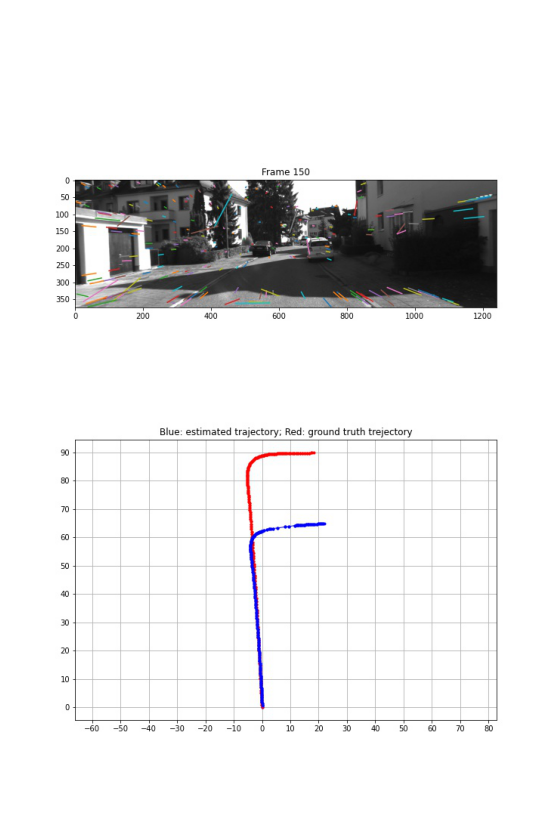

[[ 0.0943 -0.0136  0.9954 22.6531]
 [ 0.0634  0.998   0.0077 -0.6606]
 [-0.9935  0.0624  0.095  65.0141]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00258
Mean Error Translation: 0.90528
== [Result] Frame: 151, Matches 209, Inliers: 80.86
Saved at vis_preFeature/frame151.jpg
[[ 0.096  -0.0081  0.9953 23.2399]
 [ 0.0587  0.9983  0.0024 -0.6589]
 [-0.9936  0.0582  0.0963 65.0791]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00257
Mean Error Translation: 0.90080
== [Result] Frame: 152, Matches 216, Inliers: 83.80
Saved at vis_preFeature/frame152.jpg
[[ 0.0957 -0.0045  0.9954 23.7929]
 [ 0.0553  0.9985 -0.0008 -0.6593]
 [-0.9939  0.0552  0.0958 65.1435]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00256
Mean Error Translation: 0.89663
== [Result] Frame: 153, Matches 217, Inliers: 81.11
Saved at vis_preFeature/frame153.jpg
[[ 0.0971 -0.0052  0.9953 24.4688]
 [ 0.0559  0.9984 -0.0002 -0.6667]
 [-0.9937  0.0557  0.0973 65.1941]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

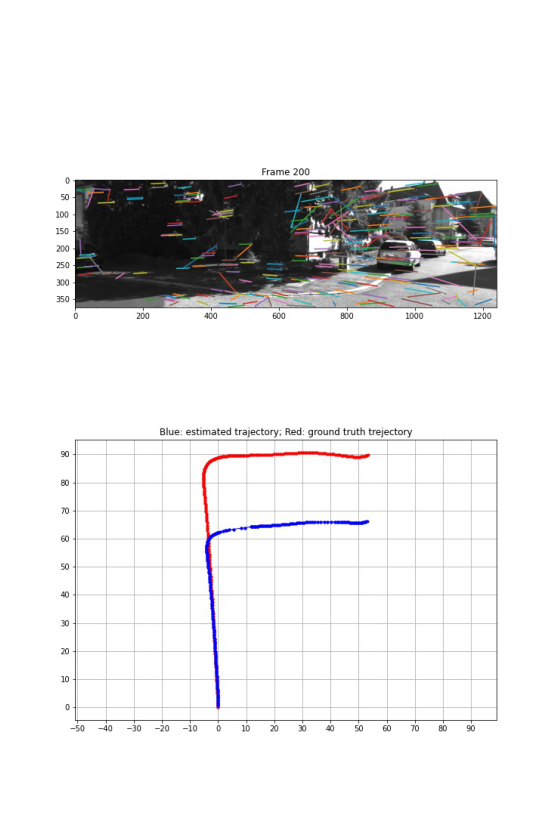

[[ 0.3665 -0.0145  0.9303 53.3871]
 [ 0.0347  0.9994  0.0019 -0.7946]
 [-0.9298  0.0316  0.3668 66.4693]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00238
Mean Error Translation: 0.73135
== [Result] Frame: 201, Matches 271, Inliers: 74.91
Saved at vis_preFeature/frame201.jpg
[[ 0.4228 -0.0137  0.9061 53.7109]
 [ 0.0366  0.9993 -0.0019 -0.8048]
 [-0.9055  0.034   0.423  66.6548]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00237
Mean Error Translation: 0.72835
== [Result] Frame: 202, Matches 277, Inliers: 70.04
Saved at vis_preFeature/frame202.jpg
[[ 0.4815 -0.0108  0.8764 54.0295]
 [ 0.0387  0.9992 -0.0089 -0.8156]
 [-0.8756  0.0382  0.4815 66.858 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00237
Mean Error Translation: 0.72522
== [Result] Frame: 203, Matches 269, Inliers: 61.34
Saved at vis_preFeature/frame203.jpg
[[ 0.5396 -0.0076  0.8419 54.3268]
 [ 0.0411  0.999  -0.0173 -0.82  ]
 [-0.8409  0.0439  0.5393 67.0788]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

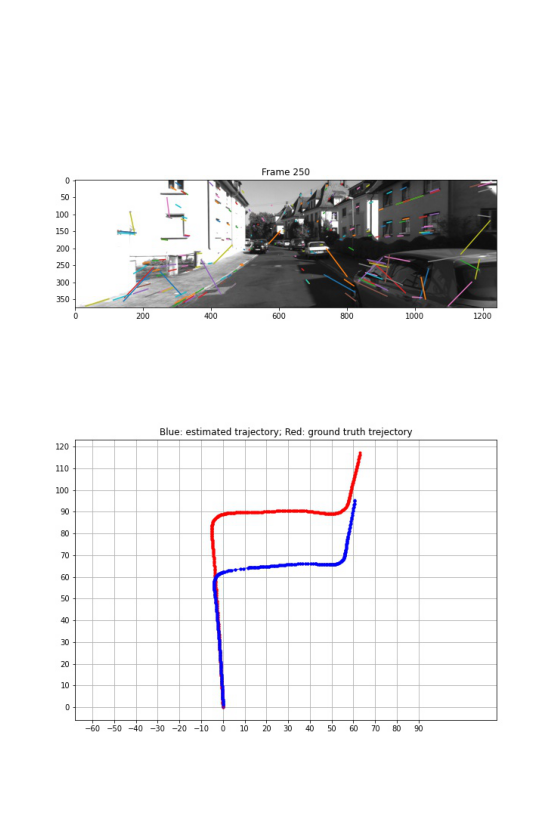

[[ 0.9839  0.0089  0.1787 60.8805]
 [-0.0033  0.9995 -0.0316 -1.9435]
 [-0.1789  0.0305  0.9834 96.0594]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00226
Mean Error Translation: 0.61560
== [Result] Frame: 251, Matches 211, Inliers: 76.78
Saved at vis_preFeature/frame251.jpg
[[ 0.9838  0.0138  0.1789 60.9836]
 [-0.0076  0.9994 -0.035  -1.9682]
 [-0.1792  0.033   0.9833 96.66  ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00226
Mean Error Translation: 0.61409
== [Result] Frame: 252, Matches 221, Inliers: 84.16
Saved at vis_preFeature/frame252.jpg
[[ 0.9833  0.0224  0.1804 61.0711]
 [-0.0159  0.9992 -0.0371 -1.9855]
 [-0.1811  0.0337  0.9829 97.2695]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00226
Mean Error Translation: 0.61261
== [Result] Frame: 253, Matches 210, Inliers: 83.33
Saved at vis_preFeature/frame253.jpg
[[ 0.9829  0.027   0.1824 61.1819]
 [-0.0206  0.9991 -0.0368 -2.0103]
 [-0.1832  0.0324  0.9825 97.8874]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

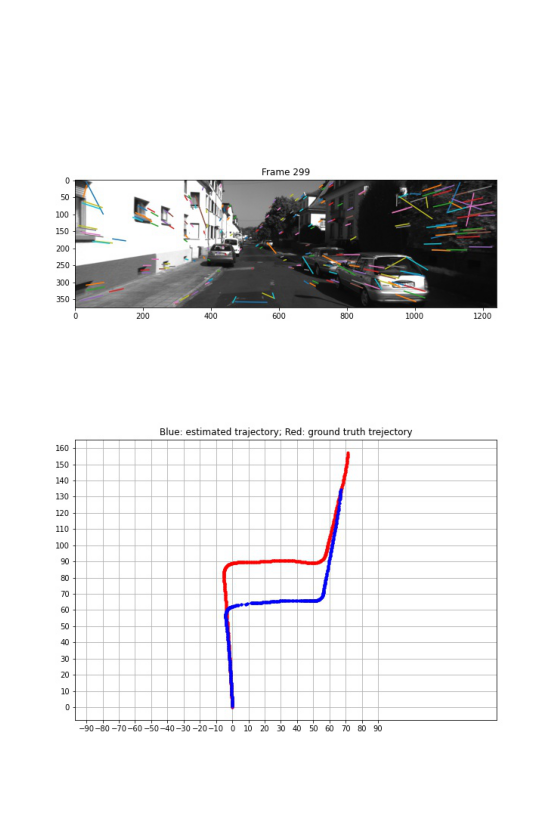

In [10]:
import runFeature
dataset_path = '/Users/QV/code-project/datasets/dataset_SfM/'
feature_dir = 'SIFT'
runFeature.runSFM(dataset_path, feature_dir )

1. Report the final rotation and translation error. **(2 points)**

SIFT result

Mean Error Rotation: 0.00228

Mean Error Translation: 0.55238

libviso2 result

Mean Error Rotation: 0.00299

Mean Error Translation: 0.53948

Next, answer the following questions:

2. Does SIFT yield higher accuracy than the original $\mathtt{libviso2}$? Why or why not? If not, can you suggest one possible way to improve? **(5 points)**

SIFT yields higher accuracy when estimating rotation but lower accuracy when estimating translation. Since SIFT is used purely to extract the feature point, we can look at the number of matched points to determine why SIFT does not yield improved accuracy in both rotation and translation. The comparison against libviso2 is shown below.

SIFT

Matches 222, Inliers: 81.53

libviso2

Matches 295, Inliers: 85.42

SIFT detects fewer matches and also result in lower percentage of the matches becoming inliner when estimating the fundamental matrix. This explains why SIFT has worse performance when estimating translation. Looking visually at the images, we can also see that libviso2 obtains features more uniformly over the images and over the z-axis of the camera. 

To improve accuracy, we can tune the hyper-parameters of SIFT to return more keypoints and then perform the post-processing steps of bucketing. This will have similar effects as to distribute the feature points more evenly over the images and over the z-axis of the camera.

3. Explain how SIFT achieves invariance to 
       a. illumination
       b. rotation
       c. scale
 **(3 points)**

(a) The feature descriptor vector is normalized to unit length  to enhance invariance to affine changes in illumination. SIFT  also detect keypoints in high contrast regions, such as objects edges, which are more invariant to illumination changes.

(b) The keypoint descriptor is computed using local image gradient directions. The gradient direction is rotated so that the dominant direction points in a canonical directions. Thus, two identical patches, with one being a rotated version of the other, would have the same feature descriptor.

(c) By construction of the scale space through difference of Gaussians, SIFT detects feature points at multiple scale of the image. Therefore, the detected feature points are more invariant to scale.

## Question 3: Using SuperPoint[1] for SFM

Now you are required to use keypoints and feature descriptors from SuperPoint for SFM. The code for the trained model of this method can be found from the $\mathtt{SuperPoint}$.

(A) Go to $\mathtt{SuperPoint}$ directory and run $\mathtt{demo\_superpoint.py}$. The detected keypoints and feature descriptors are under the directory $\mathtt{SuperPoint}$. The file format is similar to the SIFT case. For image $\mathtt{000abc.png}$, the pre-computed features and keypoints should be saved in a $\mathtt{.npy}$ file named as $\mathtt{000abc\_feature.npy}$. The variable is a $258\times N$ matrix with $\mathtt{single}$ precision, where $N$ is the number of feature points being detected. For each $258$-dimensional feature vector, the first two dimensions are the locations of the keypoint (column number first and then row number) on the image plane and the last $256$ dimensions represent the feature descriptor. 

(B) Run the following script

Mean Error Rotation: inf
Mean Error Translation: inf
== [Result] Frame: 0, Matches 0, Inliers: 0.00
Saved at vis_preFeature/frame000.jpg


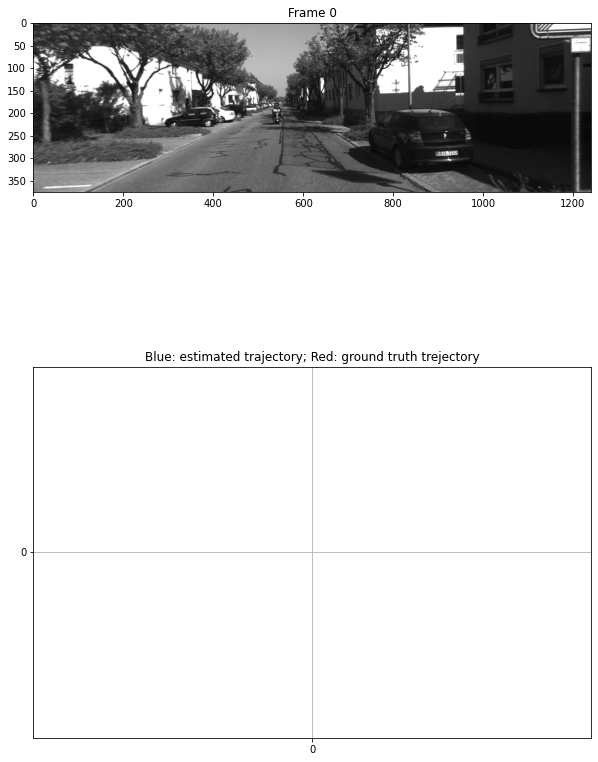

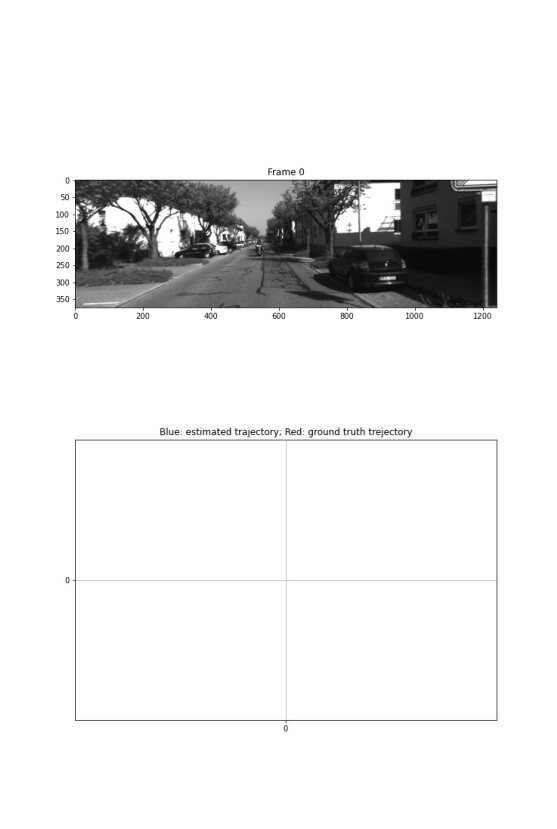

[[ 1.     -0.0065 -0.0059  0.021 ]
 [ 0.0065  1.     -0.0022 -0.0028]
 [ 0.0059  0.0022  1.      0.5221]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.08094
Mean Error Translation: 97.53184
== [Result] Frame: 1, Matches 293, Inliers: 66.89
Saved at vis_preFeature/frame001.jpg
[[ 0.9999 -0.0057 -0.012   0.0292]
 [ 0.0057  1.     -0.0043  0.0009]
 [ 0.012   0.0042  0.9999  1.0043]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.04340
Mean Error Translation: 48.95631
== [Result] Frame: 2, Matches 300, Inliers: 75.67
Saved at vis_preFeature/frame002.jpg
[[ 0.9999 -0.0059 -0.015   0.0104]
 [ 0.0058  1.     -0.0055 -0.0065]
 [ 0.015   0.0055  0.9999  1.5002]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.02948
Mean Error Translation: 32.75902
== [Result] Frame: 3, Matches 313, Inliers: 68.69
Saved at vis_preFeature/frame003.jpg
[[ 0.9998 -0.0039 -0.0192 -0.0082]
 [ 0.0038  1.     -0.0059 -0.0133]
 [ 0.0192  0.0058  0.9998  2.0125]
 [ 0.      0.      0.    

<Figure size 432x288 with 0 Axes>

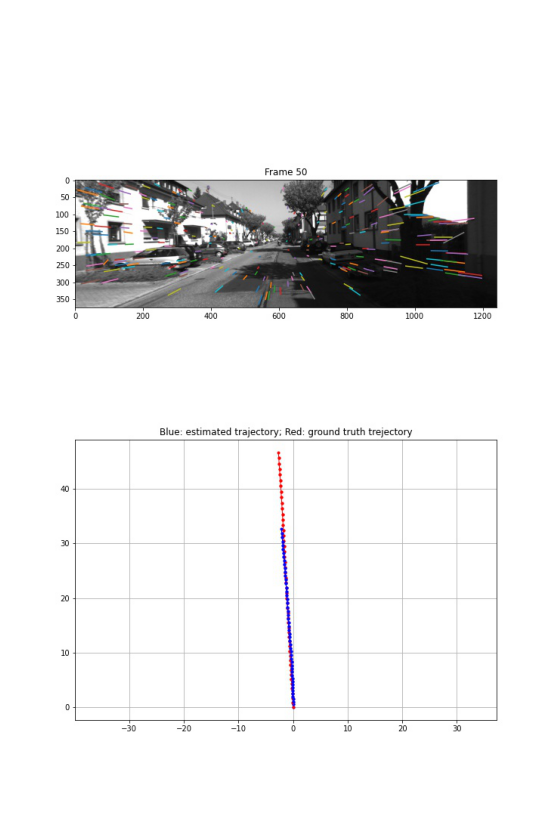

[[ 0.9969 -0.0075 -0.0777 -2.1768]
 [ 0.0081  0.9999  0.0066 -0.35  ]
 [ 0.0777 -0.0073  0.997  33.4035]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00461
Mean Error Translation: 2.18567
== [Result] Frame: 51, Matches 283, Inliers: 65.72
Saved at vis_preFeature/frame051.jpg
[[ 0.9969 -0.0065 -0.0786 -2.2388]
 [ 0.0067  1.      0.0028 -0.3551]
 [ 0.0786 -0.0033  0.9969 34.2244]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00458
Mean Error Translation: 2.14686
== [Result] Frame: 52, Matches 283, Inliers: 69.96
Saved at vis_preFeature/frame052.jpg
[[ 0.9969 -0.0029 -0.0781 -2.3227]
 [ 0.0029  1.     -0.0006 -0.3686]
 [ 0.0781  0.0004  0.9969 35.0314]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00460
Mean Error Translation: 2.10960
== [Result] Frame: 53, Matches 292, Inliers: 72.95
Saved at vis_preFeature/frame053.jpg
[[ 0.9969 -0.0021 -0.0792 -2.3807]
 [ 0.002   1.     -0.0014 -0.381 ]
 [ 0.0792  0.0012  0.9969 35.8016]
 [ 0.      0.      0.    

<Figure size 432x288 with 0 Axes>

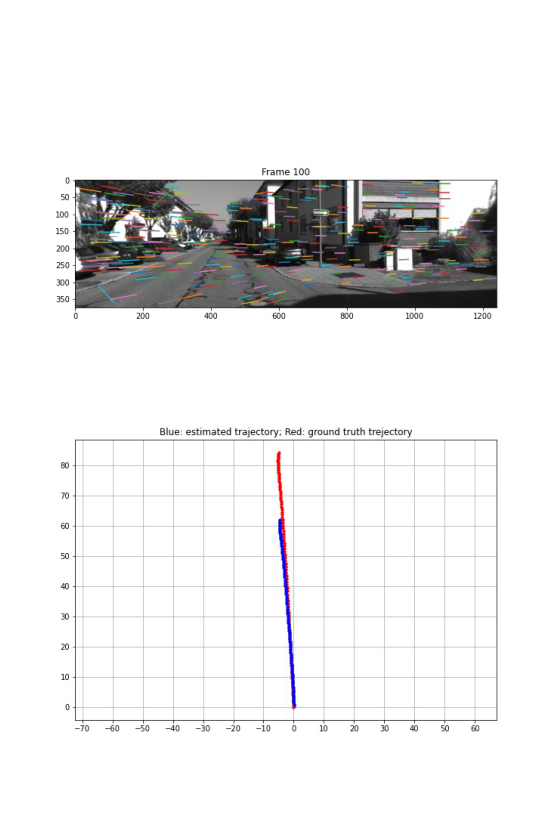

[[ 0.9822 -0.0032  0.1878 -4.3786]
 [ 0.0024  1.      0.0045 -0.7312]
 [-0.1878 -0.004   0.9822 62.4296]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00373
Mean Error Translation: 1.18481
== [Result] Frame: 101, Matches 296, Inliers: 81.76
Saved at vis_preFeature/frame101.jpg
[[ 0.972  -0.0015  0.2348 -4.2657]
 [ 0.0009  1.      0.0026 -0.7362]
 [-0.2348 -0.0023  0.972  62.7342]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00371
Mean Error Translation: 1.17407
== [Result] Frame: 102, Matches 305, Inliers: 79.67
Saved at vis_preFeature/frame102.jpg
[[ 0.9596 -0.0067  0.2814 -4.0896]
 [ 0.0074  1.     -0.0015 -0.7412]
 [-0.2814  0.0035  0.9596 63.0165]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00380
Mean Error Translation: 1.16368
== [Result] Frame: 103, Matches 302, Inliers: 78.15
Saved at vis_preFeature/frame103.jpg
[[ 0.9427 -0.0115  0.3334 -3.919 ]
 [ 0.0134  0.9999 -0.0034 -0.7476]
 [-0.3333  0.0076  0.9428 63.2865]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

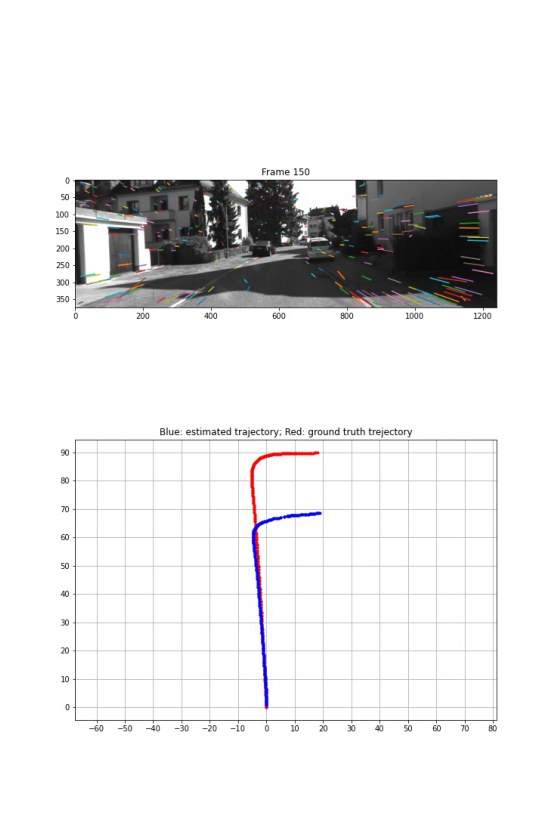

[[ 0.1178 -0.0265  0.9927 19.6087]
 [ 0.0923  0.9956  0.0156 -0.5708]
 [-0.9887  0.0898  0.1198 68.7593]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00362
Mean Error Translation: 0.84848
== [Result] Frame: 151, Matches 239, Inliers: 76.57
Saved at vis_preFeature/frame151.jpg
[[ 0.1205 -0.0215  0.9925 20.2501]
 [ 0.0887  0.996   0.0108 -0.5732]
 [-0.9887  0.0867  0.1219 68.8348]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00362
Mean Error Translation: 0.84402
== [Result] Frame: 152, Matches 238, Inliers: 75.63
Saved at vis_preFeature/frame152.jpg
[[ 0.1203 -0.0179  0.9926 20.9406]
 [ 0.0869  0.9962  0.0075 -0.5659]
 [-0.9889  0.0854  0.1214 68.9274]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00360
Mean Error Translation: 0.83939
== [Result] Frame: 153, Matches 244, Inliers: 75.82
Saved at vis_preFeature/frame153.jpg
[[ 0.1192 -0.0174  0.9927 21.6256]
 [ 0.0833  0.9965  0.0075 -0.5596]
 [-0.9894  0.0818  0.1202 69.0412]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

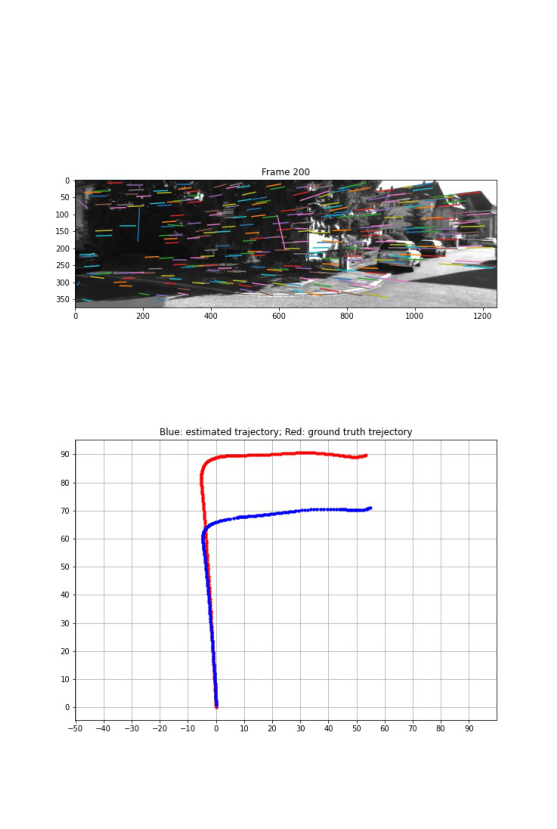

[[ 0.3742 -0.0255  0.927  55.2867]
 [ 0.0567  0.9984  0.0045 -0.4674]
 [-0.9256  0.0509  0.375  71.222 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00331
Mean Error Translation: 0.68603
== [Result] Frame: 201, Matches 301, Inliers: 73.75
Saved at vis_preFeature/frame201.jpg
[[ 0.4298 -0.0243  0.9026 55.6075]
 [ 0.0582  0.9983 -0.0009 -0.4758]
 [-0.901   0.0529  0.4305 71.4145]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00330
Mean Error Translation: 0.68326
== [Result] Frame: 202, Matches 326, Inliers: 77.30
Saved at vis_preFeature/frame202.jpg
[[ 0.488  -0.0189  0.8726 55.9135]
 [ 0.0571  0.9983 -0.0104 -0.4782]
 [-0.871   0.0549  0.4883 71.6212]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00331
Mean Error Translation: 0.68041
== [Result] Frame: 203, Matches 327, Inliers: 65.75
Saved at vis_preFeature/frame203.jpg
[[ 0.5468 -0.0161  0.8371 56.1952]
 [ 0.0584  0.9981 -0.019  -0.496 ]
 [-0.8352  0.0593  0.5467 71.8287]
 [ 0.      0.      0. 

<Figure size 432x288 with 0 Axes>

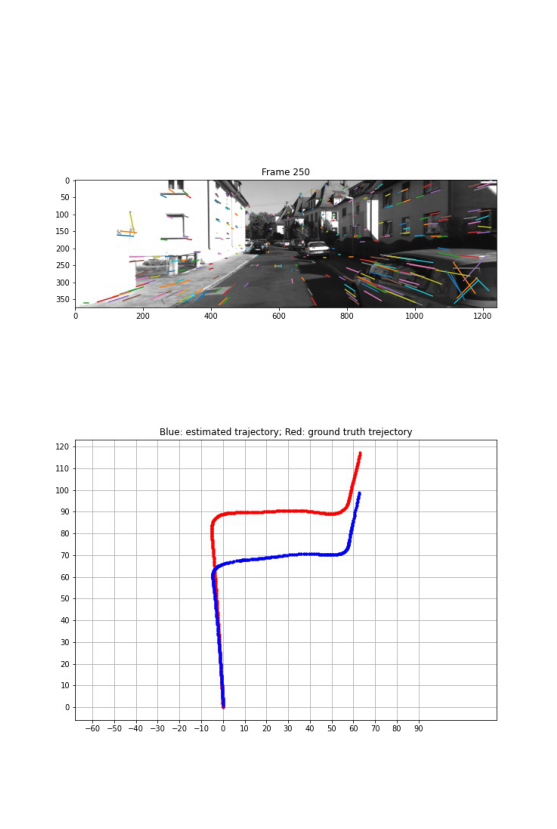

[[ 0.9765  0.0454  0.2108 62.8976]
 [-0.038   0.9985 -0.0389 -1.676 ]
 [-0.2123  0.03    0.9767 99.5062]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00328
Mean Error Translation: 0.58075
== [Result] Frame: 251, Matches 250, Inliers: 71.60
Saved at vis_preFeature/frame251.jpg
[[  0.9758   0.0531   0.2121  63.0161]
 [ -0.0451   0.9981  -0.0424  -1.7068]
 [ -0.2139   0.0318   0.9763 100.1034]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00328
Mean Error Translation: 0.57938
== [Result] Frame: 252, Matches 268, Inliers: 71.27
Saved at vis_preFeature/frame252.jpg
[[  0.9753   0.0611   0.2124  63.1405]
 [ -0.0529   0.9976  -0.0441  -1.7355]
 [ -0.2146   0.0318   0.9762 100.698 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00327
Mean Error Translation: 0.57804
== [Result] Frame: 253, Matches 237, Inliers: 78.06
Saved at vis_preFeature/frame253.jpg
[[  0.9736   0.0692   0.2174  63.2466]
 [ -0.0609   0.9971  -0.0446  -1.7589]
 [ -0.2199   0.03

<Figure size 432x288 with 0 Axes>

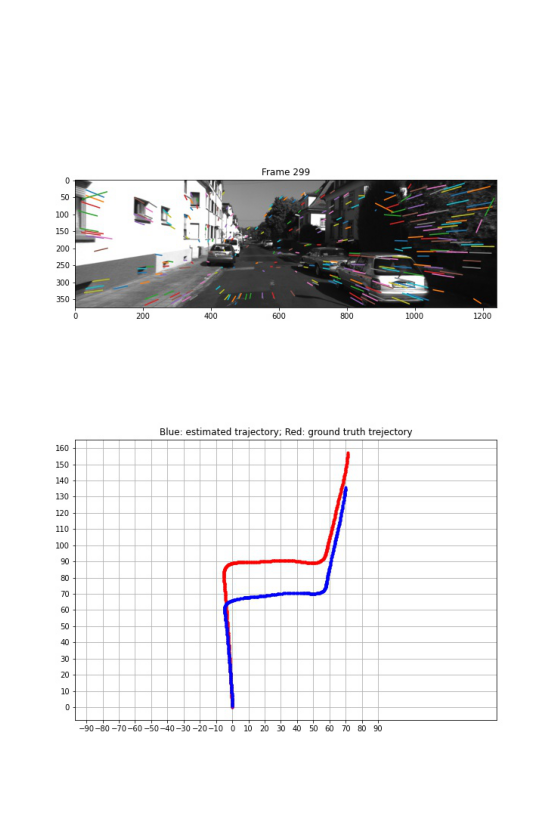

In [11]:
import runFeature
dataset_path = '/Users/QV/code-project/datasets/dataset_SfM'
feature_dir = 'SuperPoint'
runFeature.runSFM(dataset_path, feature_dir )

1. Report the final rotation and translation error. **(2 points)**

### SuperPoint result

Mean Error Rotation: 0.00321

Mean Error Translation: 0.51857

Matches 282, Inliers: 71.63

libviso2 result

Mean Error Rotation: 0.00299

Mean Error Translation: 0.53948

Matches 295, Inliers: 85.42


Next, answer the following questions:

2. Does SuperPoint yield higher accuracy than the original $\mathtt{libviso2}$? If so, why? If not, what steps can you take to improve? **(5 points)**

SuperPoint yields lower error when estimating translation but higher error when estimating rotation. The number of matches and inliner for SuperPoint is lower than libviso2. This can explained why SuperPoint is not better than libviso2 in both translation and rotation estimation. Since SIFT feature points are better at estimating translation and is worse in estimating rotation, we can combine the feature detected by SuperPoint and SIFT to improve performance.

3. Explain briefly how the following issues are being handled in SuperPoint: **(3 points)**
       a. Obtaining ground truth for keypoints.
       b. Cheaply obtaining accurate ground truth matches, as compared to LIDAR in UCN or SFM in LIFT.
       c. Learning a correlated feature representation for keypoint detection and description? 

a. Obtaining ground truth for keypoints. 

SuperPoint trains an initial interest point detector on synthetic data, then apply a Homographic Adaptation procedure to label images from a target, unlabeled domain with interest points. A fully-convolutional network is trained to predict the generated label.

b. Cheaply obtaining accurate ground truth matches, as compared to LIDAR in UCN or SFM in LIFT. 

SuperPoint warps the image and applies the same warping operations to the interest points to obtain grouth truth matches. The homography used for warping includes translation, scale, in-plane rotation, and symmetric perspective distortion.

c. Learning a correlated feature representation for keypoint detection and description?

The keypoint detection and description share an initial feature extractor network, whose output is fed into 2 separate network for keypoint detection and keypoint description.


## Question 4: Using SPyNet [5] for SFM

Now we will compute camera motion from optical flow computed using SPyNet. We first uniformly sample points in an image, then consider the flow-displaced point in the other image as a match. A modified PyTorch implementation of SPyNet is provided in directory  $\mathtt{Flow}$.

(A) Go to $\mathtt{Flow}$ and run $\mathtt{demo\_spynet.py}$. 

(B) Run the following script.

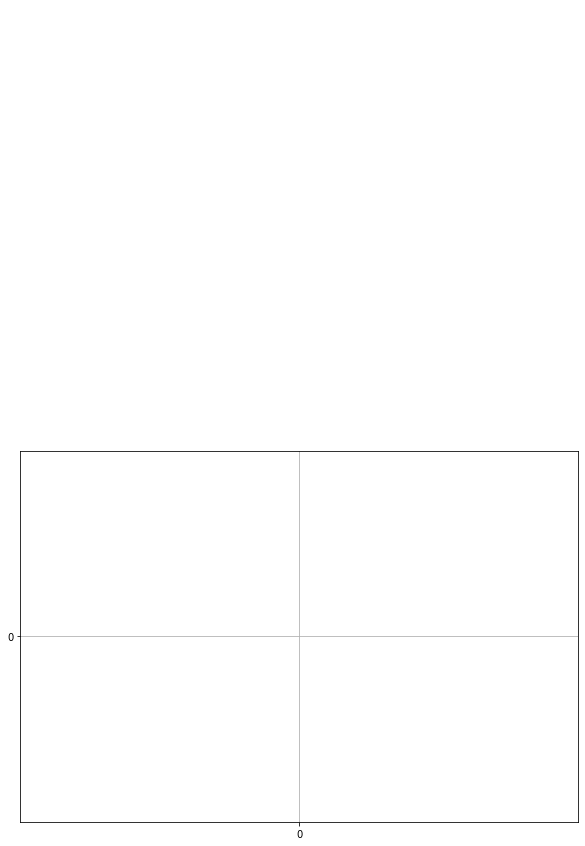

Mean Error Rotation: inf
Mean Error Translation: inf
== [Result] Frame: 0, Matches 0, Inliers: 0.00


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame000.jpg


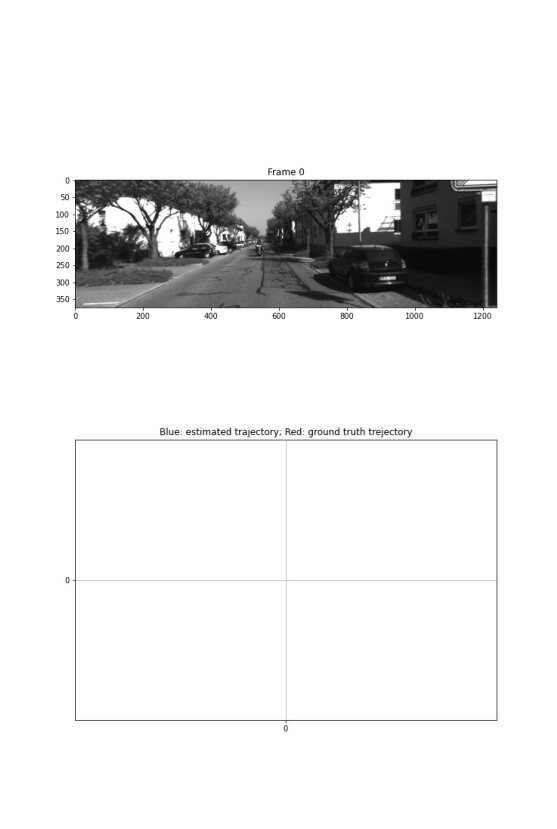

(1463, 4)
[[ 1.     -0.0032 -0.0038  0.001 ]
 [ 0.0032  1.     -0.0021 -0.0071]
 [ 0.0038  0.002   1.      0.4649]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.07540
Mean Error Translation: 97.58477
== [Result] Frame: 1, Matches 1463, Inliers: 97.74


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame001.jpg
(1463, 4)
[[ 1.     -0.0011 -0.0081 -0.0071]
 [ 0.0011  1.     -0.0033 -0.0153]
 [ 0.0081  0.0033  1.      0.9386]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.03963
Mean Error Translation: 48.98556
== [Result] Frame: 2, Matches 1463, Inliers: 96.65


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame002.jpg
(1463, 4)
[[ 0.9999 -0.0001 -0.012  -0.0176]
 [ 0.      1.     -0.0045 -0.0217]
 [ 0.012   0.0045  0.9999  1.4016]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.02731
Mean Error Translation: 32.78971
== [Result] Frame: 3, Matches 1463, Inliers: 95.28


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame003.jpg
(1463, 4)
[[ 0.9998  0.0009 -0.0174 -0.0261]
 [-0.001   1.     -0.0049 -0.0278]
 [ 0.0174  0.005   0.9998  1.8681]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.02170
Mean Error Translation: 24.69069
== [Result] Frame: 4, Matches 1463, Inliers: 94.60


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame004.jpg
(1463, 4)
[[ 0.9998 -0.0002 -0.0219 -0.0386]
 [ 0.0001  1.     -0.0051 -0.0351]
 [ 0.0219  0.0051  0.9997  2.3425]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01823
Mean Error Translation: 19.82983
== [Result] Frame: 5, Matches 1463, Inliers: 91.73


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame005.jpg
(1463, 4)
[[ 0.9997  0.0022 -0.0261 -0.0588]
 [-0.0024  1.     -0.0061 -0.0426]
 [ 0.0261  0.0062  0.9996  2.8178]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01586
Mean Error Translation: 16.58883
== [Result] Frame: 6, Matches 1463, Inliers: 92.00


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame006.jpg
(1463, 4)
[[ 0.9995  0.0056 -0.0306 -0.0854]
 [-0.0058  1.     -0.0069 -0.0466]
 [ 0.0306  0.0071  0.9995  3.3064]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01437
Mean Error Translation: 14.27208
== [Result] Frame: 7, Matches 1463, Inliers: 90.29


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame007.jpg
(1463, 4)
[[ 0.9994  0.0078 -0.0341 -0.1167]
 [-0.008   1.     -0.0053 -0.053 ]
 [ 0.034   0.0056  0.9994  3.813 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01319
Mean Error Translation: 12.53209
== [Result] Frame: 8, Matches 1463, Inliers: 90.29


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame008.jpg
(1463, 4)
[[ 0.9993  0.0126 -0.0352 -0.1715]
 [-0.0127  0.9999 -0.0028 -0.0599]
 [ 0.0351  0.0033  0.9994  4.3272]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01260
Mean Error Translation: 11.17798
== [Result] Frame: 9, Matches 1463, Inliers: 90.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame009.jpg
(1463, 4)
[[ 0.9992  0.0156 -0.0374 -0.2087]
 [-0.0157  0.9999 -0.0001 -0.0674]
 [ 0.0374  0.0007  0.9993  4.8767]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01199
Mean Error Translation: 10.09120
== [Result] Frame: 10, Matches 1463, Inliers: 89.20


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame010.jpg
(1463, 4)
[[ 0.999   0.0192 -0.0393 -0.246 ]
 [-0.0192  0.9998 -0.0005 -0.0773]
 [ 0.0393  0.0012  0.9992  5.4449]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01131
Mean Error Translation: 9.20018
== [Result] Frame: 11, Matches 1463, Inliers: 93.37


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame011.jpg
(1463, 4)
[[ 0.999   0.0149 -0.0427 -0.2616]
 [-0.0149  0.9999 -0.0008 -0.0796]
 [ 0.0427  0.0015  0.9991  6.0208]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01096
Mean Error Translation: 8.45731
== [Result] Frame: 12, Matches 1463, Inliers: 92.14


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame012.jpg
(1463, 4)
[[ 0.999   0.0136 -0.0436 -0.2948]
 [-0.0136  0.9999 -0.0015 -0.0845]
 [ 0.0436  0.0021  0.999   6.584 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.01036
Mean Error Translation: 7.82956
== [Result] Frame: 13, Matches 1463, Inliers: 89.61


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame013.jpg
(1463, 4)
[[ 0.9989  0.0139 -0.0451 -0.3272]
 [-0.0139  0.9999 -0.0007 -0.0912]
 [ 0.045   0.0013  0.999   7.1556]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00984
Mean Error Translation: 7.29084
== [Result] Frame: 14, Matches 1463, Inliers: 94.81


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame014.jpg
(1463, 4)
[[ 0.9989  0.0118 -0.0463 -0.3571]
 [-0.0119  0.9999 -0.0012 -0.0958]
 [ 0.0463  0.0017  0.9989  7.7454]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00928
Mean Error Translation: 6.82250
== [Result] Frame: 15, Matches 1463, Inliers: 95.83


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame015.jpg
(1463, 4)
[[ 0.9988  0.0159 -0.0465 -0.4043]
 [-0.0161  0.9999 -0.0032 -0.1095]
 [ 0.0465  0.0039  0.9989  8.3272]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00895
Mean Error Translation: 6.41363
== [Result] Frame: 16, Matches 1463, Inliers: 95.56


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame016.jpg
(1463, 4)
[[ 0.9987  0.0208 -0.0459 -0.4589]
 [-0.021   0.9998 -0.0057 -0.1228]
 [ 0.0458  0.0067  0.9989  8.924 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00881
Mean Error Translation: 6.05239
== [Result] Frame: 17, Matches 1463, Inliers: 98.36


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame017.jpg
(1463, 4)
[[ 0.9985  0.0311 -0.0447 -0.5299]
 [-0.0315  0.9995 -0.0075 -0.136 ]
 [ 0.0444  0.0089  0.999   9.5351]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00891
Mean Error Translation: 5.73111
== [Result] Frame: 18, Matches 1463, Inliers: 93.71


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame018.jpg
(1463, 4)
[[ 0.9984  0.0338 -0.045  -0.5736]
 [-0.0342  0.9994 -0.0067 -0.1518]
 [ 0.0447  0.0082  0.999  10.17  ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00858
Mean Error Translation: 5.44292
== [Result] Frame: 19, Matches 1463, Inliers: 87.63


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame019.jpg
(1463, 4)
[[ 0.9984  0.0352 -0.0453 -0.6244]
 [-0.0354  0.9994 -0.0049 -0.1696]
 [ 0.0451  0.0065  0.999  10.8344]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00829
Mean Error Translation: 5.18255
== [Result] Frame: 20, Matches 1463, Inliers: 87.56


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame020.jpg
(1463, 4)
[[ 0.9983  0.0354 -0.0469 -0.6598]
 [-0.0356  0.9994 -0.0034 -0.1794]
 [ 0.0468  0.0051  0.9989 11.5037]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00790
Mean Error Translation: 4.94702
== [Result] Frame: 21, Matches 1463, Inliers: 90.84


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame021.jpg
(1463, 4)
[[ 0.9982  0.0362 -0.0479 -0.7002]
 [-0.0364  0.9993 -0.0034 -0.1903]
 [ 0.0478  0.0051  0.9988 12.1626]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00763
Mean Error Translation: 4.73366
== [Result] Frame: 22, Matches 1463, Inliers: 95.28


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame022.jpg
(1463, 4)
[[ 0.9981  0.0369 -0.0491 -0.7395]
 [-0.0372  0.9993 -0.0044 -0.196 ]
 [ 0.0489  0.0062  0.9988 12.791 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00736
Mean Error Translation: 4.54028
== [Result] Frame: 23, Matches 1463, Inliers: 88.86


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame023.jpg
(1463, 4)
[[ 0.9981  0.036  -0.0499 -0.7807]
 [-0.0363  0.9993 -0.0048 -0.2126]
 [ 0.0497  0.0066  0.9987 13.4221]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00712
Mean Error Translation: 4.36302
== [Result] Frame: 24, Matches 1463, Inliers: 87.70


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame024.jpg
(1463, 4)
[[ 0.998   0.0375 -0.0502 -0.8206]
 [-0.0377  0.9993 -0.0032 -0.2192]
 [ 0.05    0.0051  0.9987 14.0298]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00693
Mean Error Translation: 4.20130
== [Result] Frame: 25, Matches 1463, Inliers: 89.47


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame025.jpg
(1463, 4)
[[ 0.998   0.0399 -0.0495 -0.8633]
 [-0.0399  0.9992  0.0002 -0.2292]
 [ 0.0495  0.0018  0.9988 14.6257]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00672
Mean Error Translation: 4.05275
== [Result] Frame: 26, Matches 1463, Inliers: 92.48


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame026.jpg
(1463, 4)
[[ 0.9978  0.0489 -0.0454 -0.9396]
 [-0.0488  0.9988  0.0031 -0.2363]
 [ 0.0455 -0.0009  0.999  15.2503]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00694
Mean Error Translation: 3.91422
== [Result] Frame: 27, Matches 1463, Inliers: 91.93


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame027.jpg
(1463, 4)
[[ 0.9979  0.0484 -0.0432 -0.9791]
 [-0.0482  0.9988  0.0052 -0.2349]
 [ 0.0434 -0.0031  0.9991 15.9013]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00674
Mean Error Translation: 3.78489
== [Result] Frame: 28, Matches 1463, Inliers: 91.25


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame028.jpg
(1463, 4)
[[ 0.9979  0.051  -0.04   -1.0291]
 [-0.0508  0.9987  0.0057 -0.2408]
 [ 0.0403 -0.0036  0.9992 16.5557]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00667
Mean Error Translation: 3.66443
== [Result] Frame: 29, Matches 1463, Inliers: 92.41


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame029.jpg
(1463, 4)
[[ 0.9977  0.0578 -0.0361 -1.0927]
 [-0.0577  0.9983  0.0023 -0.2468]
 [ 0.0362 -0.0002  0.9993 17.2161]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00679
Mean Error Translation: 3.55189
== [Result] Frame: 30, Matches 1463, Inliers: 94.12


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame030.jpg
(1463, 4)
[[ 0.9974  0.0634 -0.0336 -1.1454]
 [-0.0635  0.998  -0.0028 -0.2543]
 [ 0.0333  0.0049  0.9994 17.8749]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00680
Mean Error Translation: 3.44677
== [Result] Frame: 31, Matches 1463, Inliers: 92.14


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame031.jpg
(1463, 4)
[[ 0.9975  0.0633 -0.0321 -1.1771]
 [-0.0635  0.998  -0.0057 -0.264 ]
 [ 0.0317  0.0077  0.9995 18.5491]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00662
Mean Error Translation: 3.34798
== [Result] Frame: 32, Matches 1463, Inliers: 92.62


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame032.jpg
(1463, 4)
[[ 0.9976  0.062  -0.0302 -1.2154]
 [-0.0622  0.9981 -0.0044 -0.2788]
 [ 0.0299  0.0063  0.9995 19.2287]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00649
Mean Error Translation: 3.25529
== [Result] Frame: 33, Matches 1463, Inliers: 93.30


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame033.jpg
(1463, 4)
[[ 0.9976  0.0637 -0.0281 -1.2642]
 [-0.0637  0.998   0.0006 -0.2919]
 [ 0.028   0.0012  0.9996 19.9022]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00647
Mean Error Translation: 3.16844
== [Result] Frame: 34, Matches 1463, Inliers: 87.56


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame034.jpg
(1463, 4)
[[ 0.9977  0.0624 -0.0283 -1.2888]
 [-0.0623  0.9981  0.0044 -0.3043]
 [ 0.0285 -0.0026  0.9996 20.5656]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00637
Mean Error Translation: 3.08697
== [Result] Frame: 35, Matches 1463, Inliers: 89.68


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame035.jpg
(1463, 4)
[[ 0.998   0.0566 -0.0295 -1.3056]
 [-0.0565  0.9984  0.004  -0.3163]
 [ 0.0297 -0.0023  0.9996 21.2628]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00626
Mean Error Translation: 3.00910
== [Result] Frame: 36, Matches 1463, Inliers: 83.39


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame036.jpg
(1463, 4)
[[ 0.998   0.0554 -0.0301 -1.3397]
 [-0.0554  0.9985 -0.0007 -0.3147]
 [ 0.03    0.0024  0.9995 21.9553]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00618
Mean Error Translation: 2.93555
== [Result] Frame: 37, Matches 1463, Inliers: 85.37


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame037.jpg
(1463, 4)
[[ 0.9978  0.0588 -0.0313 -1.3724]
 [-0.059   0.9982 -0.005  -0.3196]
 [ 0.0309  0.0068  0.9995 22.6444]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00612
Mean Error Translation: 2.86611
== [Result] Frame: 38, Matches 1463, Inliers: 93.16


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame038.jpg
(1463, 4)
[[ 0.9975  0.062  -0.0333 -1.4278]
 [-0.0622  0.998  -0.0057 -0.337 ]
 [ 0.0329  0.0077  0.9994 23.8551]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00606
Mean Error Translation: 2.79778
== [Result] Frame: 39, Matches 1463, Inliers: 94.12


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame039.jpg
(1463, 4)
[[ 0.9977  0.0588 -0.0346 -1.4849]
 [-0.059   0.9982 -0.0051 -0.3511]
 [ 0.0342  0.0071  0.9994 25.6818]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00603
Mean Error Translation: 2.74713
== [Result] Frame: 40, Matches 1463, Inliers: 90.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame040.jpg
(1463, 4)
[[ 0.9975  0.0618 -0.035  -1.6075]
 [-0.0619  0.9981 -0.0026 -0.3883]
 [ 0.0347  0.0048  0.9994 27.7567]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00591
Mean Error Translation: 2.70539
== [Result] Frame: 41, Matches 1463, Inliers: 84.48


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame041.jpg
(1463, 4)
[[ 0.9973  0.0646 -0.0354 -1.6484]
 [-0.0647  0.9979 -0.002  -0.3991]
 [ 0.0352  0.0043  0.9994 28.365 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00586
Mean Error Translation: 2.65139
== [Result] Frame: 42, Matches 1463, Inliers: 77.72


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame042.jpg
(1463, 4)
[[ 0.9972  0.0657 -0.0367 -1.6761]
 [-0.0657  0.9978  0.0008 -0.42  ]
 [ 0.0367  0.0016  0.9993 28.9835]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00575
Mean Error Translation: 2.59941
== [Result] Frame: 43, Matches 1463, Inliers: 84.14


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame043.jpg
(1463, 4)
[[ 0.997   0.0695 -0.0347 -1.7233]
 [-0.0695  0.9976  0.0031 -0.4253]
 [ 0.0348 -0.0007  0.9994 29.6032]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00578
Mean Error Translation: 2.54981
== [Result] Frame: 44, Matches 1463, Inliers: 80.66


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame044.jpg
(1463, 4)
[[ 0.9963  0.0793 -0.034  -1.7689]
 [-0.0791  0.9968  0.0061 -0.4431]
 [ 0.0344 -0.0034  0.9994 30.2301]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00578
Mean Error Translation: 2.50197
== [Result] Frame: 45, Matches 1463, Inliers: 80.52


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame045.jpg
(1463, 4)
[[ 0.996   0.0827 -0.0325 -1.8147]
 [-0.0826  0.9966  0.0048 -0.4458]
 [ 0.0328 -0.0021  0.9995 30.8889]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00576
Mean Error Translation: 2.45552
== [Result] Frame: 46, Matches 1463, Inliers: 90.29


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame046.jpg
(1463, 4)
[[ 0.9959  0.085  -0.0312 -1.8574]
 [-0.085   0.9964  0.0029 -0.452 ]
 [ 0.0314 -0.0002  0.9995 31.5703]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00573
Mean Error Translation: 2.41030
== [Result] Frame: 47, Matches 1463, Inliers: 92.48


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame047.jpg
(1463, 4)
[[ 0.9952  0.0931 -0.0293 -1.9172]
 [-0.0932  0.9956  0.0003 -0.4606]
 [ 0.0292  0.0024  0.9996 32.2551]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00579
Mean Error Translation: 2.36678
== [Result] Frame: 48, Matches 1463, Inliers: 87.90


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame048.jpg
(1463, 4)
[[ 0.9948  0.0975 -0.0284 -1.9681]
 [-0.0975  0.9952  0.0001 -0.471 ]
 [ 0.0282  0.0026  0.9996 32.9445]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00582
Mean Error Translation: 2.32487
== [Result] Frame: 49, Matches 1463, Inliers: 85.37


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame049.jpg
(1463, 4)
[[ 0.9949  0.097  -0.0284 -2.0076]
 [-0.0971  0.9953  0.0008 -0.4761]
 [ 0.0284  0.0019  0.9996 33.6755]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00576
Mean Error Translation: 2.28378
== [Result] Frame: 50, Matches 1463, Inliers: 84.01


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame050.jpg


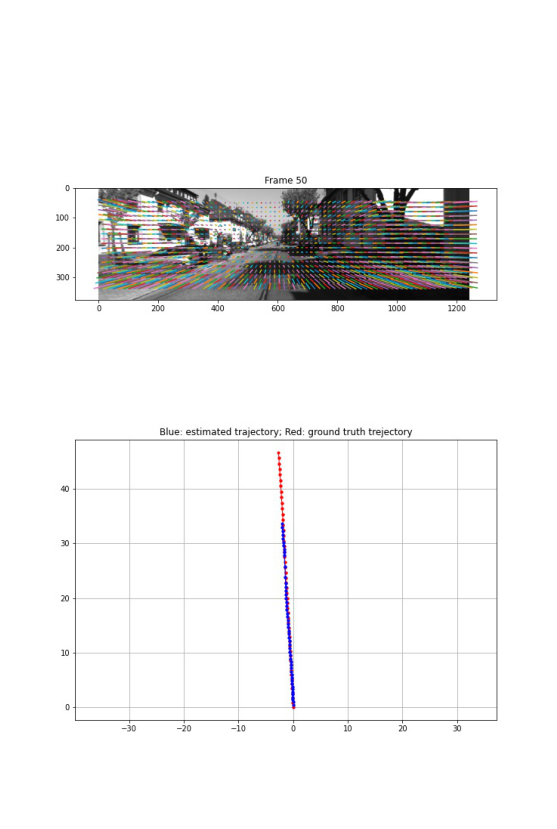

(1463, 4)
[[ 0.9948  0.0981 -0.0285 -2.0468]
 [-0.0981  0.9952  0.0017 -0.4859]
 [ 0.0285  0.0011  0.9996 34.4631]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00568
Mean Error Translation: 2.24313
== [Result] Frame: 51, Matches 1463, Inliers: 84.28


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame051.jpg
(1463, 4)
[[ 0.9941  0.1049 -0.0266 -2.11  ]
 [-0.105   0.9945 -0.0023 -0.4997]
 [ 0.0262  0.0051  0.9996 35.2567]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00571
Mean Error Translation: 2.20372
== [Result] Frame: 52, Matches 1463, Inliers: 85.71


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame052.jpg
(1463, 4)
[[ 0.9937  0.1085 -0.0265 -2.1668]
 [-0.1087  0.9941 -0.0063 -0.5207]
 [ 0.0256  0.0091  0.9996 36.1392]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00570
Mean Error Translation: 2.16396
== [Result] Frame: 53, Matches 1463, Inliers: 90.91


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame053.jpg
(1463, 4)
[[ 0.9935  0.1103 -0.0269 -2.2061]
 [-0.1106  0.9938 -0.0075 -0.5379]
 [ 0.0259  0.0105  0.9996 37.0711]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00563
Mean Error Translation: 2.12497
== [Result] Frame: 54, Matches 1463, Inliers: 89.41


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame054.jpg
(1463, 4)
[[ 0.9939  0.1071 -0.0272 -2.2291]
 [-0.1072  0.9942 -0.004  -0.5609]
 [ 0.0266  0.0069  0.9996 38.0382]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00560
Mean Error Translation: 2.08717
== [Result] Frame: 55, Matches 1463, Inliers: 90.36


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame055.jpg
(1463, 4)
[[ 0.9942  0.1038 -0.0281 -2.2496]
 [-0.1039  0.9946 -0.0006 -0.5864]
 [ 0.0279  0.0035  0.9996 39.059 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00553
Mean Error Translation: 2.05101
== [Result] Frame: 56, Matches 1463, Inliers: 89.68


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame056.jpg
(1463, 4)
[[ 0.994   0.1054 -0.0276 -2.3054]
 [-0.1055  0.9944  0.0002 -0.6121]
 [ 0.0275  0.0027  0.9996 40.1905]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00551
Mean Error Translation: 2.01787
== [Result] Frame: 57, Matches 1463, Inliers: 92.89


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame057.jpg
(1463, 4)
[[ 0.9938  0.1073 -0.0277 -2.3632]
 [-0.1074  0.9942 -0.0007 -0.6393]
 [ 0.0274  0.0037  0.9996 41.4357]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00553
Mean Error Translation: 1.98794
== [Result] Frame: 58, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame058.jpg
(1463, 4)
[[ 0.994   0.1055 -0.0286 -2.4072]
 [-0.1056  0.9944 -0.0021 -0.6621]
 [ 0.0282  0.0051  0.9996 42.8894]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00548
Mean Error Translation: 1.96256
== [Result] Frame: 59, Matches 1463, Inliers: 93.23


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame059.jpg
(1463, 4)
[[ 0.9939  0.1064 -0.0293 -2.436 ]
 [-0.1064  0.9943 -0.0012 -0.6698]
 [ 0.029   0.0043  0.9996 43.5434]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00544
Mean Error Translation: 1.93496
== [Result] Frame: 60, Matches 1463, Inliers: 92.00


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame060.jpg
(1463, 4)
[[ 0.9937  0.108  -0.0286 -2.4758]
 [-0.108   0.9942  0.0025 -0.6771]
 [ 0.0287  0.0006  0.9996 44.2026]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00546
Mean Error Translation: 1.90823
== [Result] Frame: 61, Matches 1463, Inliers: 89.61


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame061.jpg
(1463, 4)
[[ 0.993   0.1156 -0.0261 -2.5333]
 [-0.1155  0.9933  0.0064 -0.6809]
 [ 0.0267 -0.0034  0.9996 44.8795]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00560
Mean Error Translation: 1.88205
== [Result] Frame: 62, Matches 1463, Inliers: 88.24


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame062.jpg
(1463, 4)
[[ 0.9923  0.1214 -0.0257 -2.5739]
 [-0.1212  0.9926  0.0082 -0.6846]
 [ 0.0265 -0.005   0.9996 45.5832]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00561
Mean Error Translation: 1.85615
== [Result] Frame: 63, Matches 1463, Inliers: 92.96


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame063.jpg
(1463, 4)
[[ 0.992   0.1234 -0.0278 -2.6033]
 [-0.1233  0.9924  0.0049 -0.6997]
 [ 0.0282 -0.0015  0.9996 46.2485]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00555
Mean Error Translation: 1.83150
== [Result] Frame: 64, Matches 1463, Inliers: 95.97


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame064.jpg
(1463, 4)
[[ 0.9918  0.1239 -0.0314 -2.6208]
 [-0.124   0.9923 -0.0015 -0.7193]
 [ 0.0309  0.0054  0.9995 46.8865]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00552
Mean Error Translation: 1.80779
== [Result] Frame: 65, Matches 1463, Inliers: 91.39


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame065.jpg
(1463, 4)
[[ 0.9911  0.129  -0.0319 -2.6622]
 [-0.1292  0.9916 -0.0062 -0.7276]
 [ 0.0308  0.0103  0.9995 47.5227]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00553
Mean Error Translation: 1.78464
== [Result] Frame: 66, Matches 1463, Inliers: 94.33


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame066.jpg
(1463, 4)
[[ 0.9899  0.1378 -0.0321 -2.7093]
 [-0.138   0.9904 -0.0057 -0.7344]
 [ 0.031   0.01    0.9995 48.1767]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00553
Mean Error Translation: 1.76187
== [Result] Frame: 67, Matches 1463, Inliers: 94.87


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame067.jpg
(1463, 4)
[[ 0.9891  0.1435 -0.0321 -2.7524]
 [-0.1436  0.9896 -0.0037 -0.7443]
 [ 0.0312  0.0083  0.9995 48.8378]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00550
Mean Error Translation: 1.73949
== [Result] Frame: 68, Matches 1463, Inliers: 93.57


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame068.jpg
(1463, 4)
[[ 0.9884  0.1482 -0.0325 -2.7917]
 [-0.1484  0.9889 -0.0027 -0.7533]
 [ 0.0318  0.0075  0.9995 49.4839]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00547
Mean Error Translation: 1.71775
== [Result] Frame: 69, Matches 1463, Inliers: 94.05


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame069.jpg
(1463, 4)
[[ 0.9877  0.153  -0.0316 -2.8444]
 [-0.1532  0.9882 -0.0034 -0.7599]
 [ 0.0307  0.0082  0.9995 50.1   ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00550
Mean Error Translation: 1.69684
== [Result] Frame: 70, Matches 1463, Inliers: 91.18


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame070.jpg
(1463, 4)
[[ 0.9866  0.1603 -0.0308 -2.9086]
 [-0.1604  0.987  -0.0028 -0.7713]
 [ 0.0299  0.0077  0.9995 50.7405]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00555
Mean Error Translation: 1.67597
== [Result] Frame: 71, Matches 1463, Inliers: 85.51


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame071.jpg
(1463, 4)
[[ 0.9857  0.1658 -0.0287 -2.9758]
 [-0.166   0.9861 -0.0033 -0.7766]
 [ 0.0278  0.008   0.9996 51.403 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00558
Mean Error Translation: 1.65522
== [Result] Frame: 72, Matches 1463, Inliers: 91.11


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame072.jpg
(1463, 4)
[[ 0.9853  0.1685 -0.0279 -3.018 ]
 [-0.1687  0.9857 -0.0035 -0.7851]
 [ 0.0269  0.0082  0.9996 52.0028]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00559
Mean Error Translation: 1.63571
== [Result] Frame: 73, Matches 1463, Inliers: 89.95


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame073.jpg
(1463, 4)
[[ 0.985   0.1706 -0.0271 -3.0782]
 [-0.1707  0.9853 -0.0028 -0.798 ]
 [ 0.0262  0.0073  0.9996 52.8591]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00557
Mean Error Translation: 1.61417
== [Result] Frame: 74, Matches 1463, Inliers: 88.52


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame074.jpg
(1463, 4)
[[ 0.984   0.1763 -0.0264 -3.1357]
 [-0.1763  0.9843 -0.0003 -0.8117]
 [ 0.0259  0.0049  0.9997 53.6903]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00557
Mean Error Translation: 1.59306
== [Result] Frame: 75, Matches 1463, Inliers: 88.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame075.jpg
(1463, 4)
[[ 0.9831  0.1811 -0.0257 -3.1763]
 [-0.181   0.9835  0.0038 -0.8262]
 [ 0.026   0.0009  0.9997 54.3234]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00557
Mean Error Translation: 1.57424
== [Result] Frame: 76, Matches 1463, Inliers: 90.57


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame076.jpg
(1463, 4)
[[ 0.9827  0.1833 -0.0272 -3.2001]
 [-0.1832  0.9831  0.0055 -0.8384]
 [ 0.0277 -0.0005  0.9996 55.0136]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00550
Mean Error Translation: 1.55504
== [Result] Frame: 77, Matches 1463, Inliers: 93.57


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame077.jpg
(1463, 4)
[[ 0.982   0.1867 -0.0285 -3.2353]
 [-0.1867  0.9824  0.0014 -0.8497]
 [ 0.0283  0.0039  0.9996 55.6805]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00546
Mean Error Translation: 1.53631
== [Result] Frame: 78, Matches 1463, Inliers: 91.93


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame078.jpg
(1463, 4)
[[ 0.982   0.1862 -0.0308 -3.2636]
 [-0.1865  0.9824 -0.006  -0.8603]
 [ 0.0292  0.0117  0.9995 56.3378]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00541
Mean Error Translation: 1.51793
== [Result] Frame: 79, Matches 1463, Inliers: 89.06


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame079.jpg
(1463, 4)
[[ 0.9816  0.188  -0.0328 -3.2965]
 [-0.1884  0.982  -0.012  -0.866 ]
 [ 0.0299  0.018   0.9994 56.9097]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00539
Mean Error Translation: 1.50077
== [Result] Frame: 80, Matches 1463, Inliers: 90.57


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame080.jpg
(1463, 4)
[[ 0.9819  0.1865 -0.0342 -3.3121]
 [-0.187   0.9823 -0.0133 -0.8727]
 [ 0.0311  0.0195  0.9993 57.4172]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00537
Mean Error Translation: 1.48464
== [Result] Frame: 81, Matches 1463, Inliers: 92.62


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame081.jpg
(1463, 4)
[[ 0.9818  0.1866 -0.0342 -3.3352]
 [-0.187   0.9823 -0.0103 -0.8797]
 [ 0.0317  0.0165  0.9994 57.8775]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00534
Mean Error Translation: 1.46924
== [Result] Frame: 82, Matches 1463, Inliers: 91.18


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame082.jpg
(1463, 4)
[[ 0.9816  0.1878 -0.0341 -3.367 ]
 [-0.1882  0.9821 -0.0087 -0.8872]
 [ 0.0319  0.0149  0.9994 58.3124]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00532
Mean Error Translation: 1.45425
== [Result] Frame: 83, Matches 1463, Inliers: 94.05


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame083.jpg
(1463, 4)
[[ 0.9817  0.1874 -0.0349 -3.3975]
 [-0.1879  0.9821 -0.0126 -0.893 ]
 [ 0.0319  0.019   0.9993 58.7272]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00531
Mean Error Translation: 1.43954
== [Result] Frame: 84, Matches 1463, Inliers: 89.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame084.jpg
(1463, 4)
[[ 0.9825  0.1829 -0.0342 -3.4266]
 [-0.1836  0.9828 -0.0185 -0.9054]
 [ 0.0302  0.0245  0.9992 59.107 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00530
Mean Error Translation: 1.42535
== [Result] Frame: 85, Matches 1463, Inliers: 91.59


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame085.jpg
(1463, 4)
[[ 0.9832  0.1796 -0.0338 -3.4359]
 [-0.1804  0.9833 -0.0232 -0.9246]
 [ 0.0291  0.0289  0.9992 59.4521]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00527
Mean Error Translation: 1.41170
== [Result] Frame: 86, Matches 1463, Inliers: 93.71


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame086.jpg
(1463, 4)
[[ 0.9832  0.1801 -0.0306 -3.4457]
 [-0.1809  0.9832 -0.0241 -0.9372]
 [ 0.0257  0.0293  0.9992 59.7804]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00523
Mean Error Translation: 1.39843
== [Result] Frame: 87, Matches 1463, Inliers: 93.64


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame087.jpg
(1463, 4)
[[ 0.9827  0.1833 -0.0262 -3.4539]
 [-0.1838  0.9827 -0.0221 -0.9492]
 [ 0.0217  0.0266  0.9994 60.1051]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00521
Mean Error Translation: 1.38538
== [Result] Frame: 88, Matches 1463, Inliers: 94.26


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame088.jpg
(1463, 4)
[[ 0.9832  0.1815 -0.0216 -3.4517]
 [-0.1819  0.9831 -0.0202 -0.9622]
 [ 0.0175  0.0238  0.9996 60.4299]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00516
Mean Error Translation: 1.37245
== [Result] Frame: 89, Matches 1463, Inliers: 94.81


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame089.jpg
(1463, 4)
[[ 0.9836  0.1799 -0.0141 -3.4589]
 [-0.1801  0.9835 -0.0178 -0.9725]
 [ 0.0107  0.02    0.9997 60.7633]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00516
Mean Error Translation: 1.35954
== [Result] Frame: 90, Matches 1463, Inliers: 95.69


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame090.jpg
(1463, 4)
[[ 0.984   0.1779 -0.0051 -3.4598]
 [-0.178   0.9839 -0.0164 -0.9852]
 [ 0.0021  0.017   0.9999 61.0989]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00515
Mean Error Translation: 1.34676
== [Result] Frame: 91, Matches 1463, Inliers: 93.92


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame091.jpg
(1463, 4)
[[ 0.9838  0.1793  0.0041 -3.4432]
 [-0.1792  0.9836 -0.0184 -1.0023]
 [-0.0073  0.0173  0.9998 61.4246]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00512
Mean Error Translation: 1.33420
== [Result] Frame: 92, Matches 1463, Inliers: 95.97


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame092.jpg
(1463, 4)
[[ 0.9823  0.1864  0.0192 -3.4407]
 [-0.186   0.9823 -0.0219 -1.0129]
 [-0.023   0.018   0.9996 61.7494]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00509
Mean Error Translation: 1.32177
== [Result] Frame: 93, Matches 1463, Inliers: 95.97


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame093.jpg
(1463, 4)
[[ 0.9809  0.1911  0.0367 -3.4229]
 [-0.1903  0.9814 -0.0246 -1.0281]
 [-0.0407  0.0171  0.999  62.0676]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00504
Mean Error Translation: 1.30954
== [Result] Frame: 94, Matches 1463, Inliers: 95.01


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame094.jpg
(1463, 4)
[[ 0.9806  0.1875  0.0574 -3.3844]
 [-0.1861  0.9821 -0.0278 -1.0466]
 [-0.0615  0.0166  0.998  62.3815]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00502
Mean Error Translation: 1.29747
== [Result] Frame: 95, Matches 1463, Inliers: 93.64


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame095.jpg
(1463, 4)
[[ 0.9796  0.1833  0.0826 -3.3378]
 [-0.1812  0.9829 -0.0314 -1.0669]
 [-0.0869  0.0158  0.9961 62.6917]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00498
Mean Error Translation: 1.28551
== [Result] Frame: 96, Matches 1463, Inliers: 96.86


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame096.jpg
(1463, 4)
[[ 0.9778  0.1788  0.1095 -3.2691]
 [-0.1759  0.9838 -0.0349 -1.0923]
 [-0.114   0.0149  0.9934 62.9857]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00498
Mean Error Translation: 1.27392
== [Result] Frame: 97, Matches 1463, Inliers: 96.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame097.jpg
(1463, 4)
[[ 0.9745  0.1755  0.1401 -3.1906]
 [-0.1717  0.9844 -0.039  -1.1176]
 [-0.1447  0.014   0.9894 63.2803]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00497
Mean Error Translation: 1.26248
== [Result] Frame: 98, Matches 1463, Inliers: 97.06


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame098.jpg
(1463, 4)
[[ 0.9693  0.1728  0.1749 -3.1016]
 [-0.1675  0.9849 -0.0447 -1.1446]
 [-0.1799  0.014   0.9836 63.5722]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00496
Mean Error Translation: 1.25114
== [Result] Frame: 99, Matches 1463, Inliers: 96.38


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame099.jpg
(1463, 4)
[[ 0.9622  0.1699  0.2129 -2.9955]
 [-0.1625  0.9853 -0.0518 -1.1708]
 [-0.2186  0.0152  0.9757 63.8567]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00497
Mean Error Translation: 1.24007
== [Result] Frame: 100, Matches 1463, Inliers: 95.15


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame100.jpg


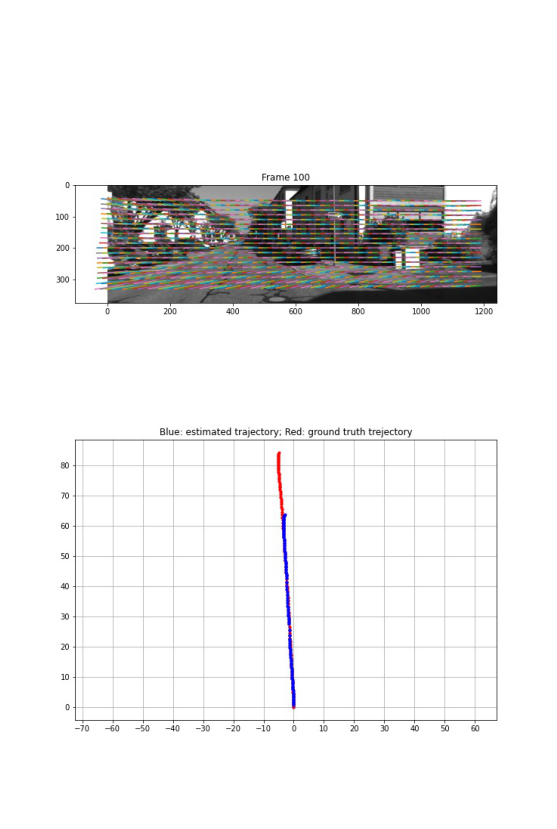

(1463, 4)
[[ 0.9527  0.1663  0.2543 -2.8737]
 [-0.1563  0.9859 -0.059  -1.2025]
 [-0.2605  0.0165  0.9653 64.1343]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00497
Mean Error Translation: 1.22917
== [Result] Frame: 101, Matches 1463, Inliers: 96.99


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame101.jpg
(1463, 4)
[[ 0.9393  0.1658  0.3005 -2.7494]
 [-0.152   0.986  -0.0688 -1.2344]
 [-0.3077  0.019   0.9513 64.4095]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00497
Mean Error Translation: 1.21825
== [Result] Frame: 102, Matches 1463, Inliers: 95.63


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame102.jpg
(1463, 4)
[[ 0.9223  0.1641  0.35   -2.6094]
 [-0.1452  0.9862 -0.0798 -1.269 ]
 [-0.3583  0.0228  0.9333 64.666 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00496
Mean Error Translation: 1.20768
== [Result] Frame: 103, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame103.jpg
(1463, 4)
[[ 0.8999  0.1636  0.4043 -2.4708]
 [-0.1388  0.9862 -0.0902 -1.2999]
 [-0.4135  0.0251  0.9102 64.9191]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00495
Mean Error Translation: 1.19713
== [Result] Frame: 104, Matches 1463, Inliers: 96.45


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame104.jpg
(1463, 4)
[[ 0.8728  0.163   0.46   -2.3172]
 [-0.1314  0.9863 -0.1002 -1.3327]
 [-0.47    0.027   0.8823 65.1619]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00494
Mean Error Translation: 1.18685
== [Result] Frame: 105, Matches 1463, Inliers: 96.92


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame105.jpg
(1463, 4)
[[ 0.8415  0.1613  0.5156 -2.143 ]
 [-0.1214  0.9864 -0.1104 -1.3651]
 [-0.5265  0.0303  0.8497 65.3904]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00493
Mean Error Translation: 1.17671
== [Result] Frame: 106, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame106.jpg
(1463, 4)
[[ 0.8063  0.1585  0.5698 -1.9531]
 [-0.1092  0.9868 -0.1199 -1.4056]
 [-0.5813  0.0345  0.813  65.5955]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00492
Mean Error Translation: 1.16668
== [Result] Frame: 107, Matches 1463, Inliers: 97.13


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame107.jpg
(1463, 4)
[[ 0.7681  0.1559  0.621  -1.7499]
 [-0.0971  0.9871 -0.1276 -1.452 ]
 [-0.6329  0.0377  0.7733 65.7845]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00491
Mean Error Translation: 1.15695
== [Result] Frame: 108, Matches 1463, Inliers: 97.20


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame108.jpg
(1463, 4)
[[ 0.717   0.161   0.6782 -1.606 ]
 [-0.094   0.9864 -0.1348 -1.4904]
 [-0.6907  0.0329  0.7224 66.0374]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00507
Mean Error Translation: 1.14758
== [Result] Frame: 109, Matches 1463, Inliers: 95.08


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame109.jpg
(1463, 4)
[[ 0.6715  0.1594  0.7237 -1.3794]
 [-0.0857  0.9867 -0.1378 -1.5403]
 [-0.736   0.0305  0.6763 66.209 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00505
Mean Error Translation: 1.13817
== [Result] Frame: 110, Matches 1463, Inliers: 94.33


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame110.jpg
(1463, 4)
[[ 0.6234  0.1591  0.7655 -1.1341]
 [-0.0764  0.9868 -0.1429 -1.5799]
 [-0.7781  0.0306  0.6273 66.3691]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00504
Mean Error Translation: 1.12878
== [Result] Frame: 111, Matches 1463, Inliers: 92.41


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame111.jpg
(1463, 4)
[[ 0.5744  0.1588  0.803  -0.8957]
 [-0.0656  0.9868 -0.1482 -1.6271]
 [-0.816   0.0325  0.5772 66.5051]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00503
Mean Error Translation: 1.11967
== [Result] Frame: 112, Matches 1463, Inliers: 91.18


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame112.jpg
(1463, 4)
[[ 0.5193  0.1594  0.8396 -0.6495]
 [-0.0556  0.9867 -0.1529 -1.6854]
 [-0.8528  0.0327  0.5212 66.6893]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00512
Mean Error Translation: 1.11066
== [Result] Frame: 113, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame113.jpg
(1463, 4)
[[ 0.4716  0.1622  0.8668 -0.215 ]
 [-0.0506  0.9863 -0.157  -1.7637]
 [-0.8804  0.0302  0.4734 66.8427]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00511
Mean Error Translation: 1.10195
== [Result] Frame: 114, Matches 1463, Inliers: 92.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame114.jpg
(1463, 4)
[[ 0.4239  0.165   0.8906  0.2652]
 [-0.0464  0.9859 -0.1605 -1.8528]
 [-0.9045  0.0268  0.4256 66.9918]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00507
Mean Error Translation: 1.09372
== [Result] Frame: 115, Matches 1463, Inliers: 96.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame115.jpg
(1463, 4)
[[ 0.3781  0.1672  0.9106  0.7749]
 [-0.0393  0.9856 -0.1646 -1.9478]
 [-0.9249  0.0264  0.3792 67.1388]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00504
Mean Error Translation: 1.08582
== [Result] Frame: 116, Matches 1463, Inliers: 94.60


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame116.jpg
(1463, 4)
[[ 0.3367  0.1653  0.927   1.2771]
 [-0.025   0.9857 -0.1667 -2.0392]
 [-0.9413  0.033   0.336  67.2461]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00500
Mean Error Translation: 1.07794
== [Result] Frame: 117, Matches 1463, Inliers: 95.15


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame117.jpg
(1463, 4)
[[ 0.3005  0.159   0.9404  1.8339]
 [-0.0032  0.9862 -0.1657 -2.1353]
 [-0.9538  0.0467  0.2969 67.3172]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00497
Mean Error Translation: 1.07052
== [Result] Frame: 118, Matches 1463, Inliers: 95.90


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame118.jpg
(1463, 4)
[[ 0.2661  0.1555  0.9513  2.449 ]
 [ 0.0078  0.9865 -0.1635 -2.2422]
 [-0.9639  0.0509  0.2613 67.4117]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00494
Mean Error Translation: 1.06372
== [Result] Frame: 119, Matches 1463, Inliers: 97.54


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame119.jpg
(1463, 4)
[[ 0.2332  0.159   0.9594  3.0772]
 [ 0.0133  0.9859 -0.1666 -2.36  ]
 [-0.9723  0.0517  0.2278 67.5181]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00492
Mean Error Translation: 1.05715
== [Result] Frame: 120, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame120.jpg
(1463, 4)
[[ 0.2     0.1656  0.9657  3.748 ]
 [ 0.0101  0.9852 -0.171  -2.5007]
 [-0.9797  0.0439  0.1954 67.6452]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00491
Mean Error Translation: 1.05107
== [Result] Frame: 121, Matches 1463, Inliers: 96.04


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame121.jpg
(1463, 4)
[[ 0.1711  0.1698  0.9705  4.463 ]
 [ 0.0116  0.9846 -0.1743 -2.6465]
 [-0.9852  0.0411  0.1665 67.7491]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00490
Mean Error Translation: 1.04537
== [Result] Frame: 122, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame122.jpg
(1463, 4)
[[ 0.1458  0.1722  0.9742  5.2043]
 [ 0.0174  0.9841 -0.1765 -2.7869]
 [-0.9892  0.0427  0.1404 67.8154]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00487
Mean Error Translation: 1.03983
== [Result] Frame: 123, Matches 1463, Inliers: 96.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame123.jpg
(1463, 4)
[[ 0.1234  0.1745  0.9769  5.9902]
 [ 0.0291  0.9834 -0.1794 -2.9263]
 [-0.9919  0.0505  0.1163 67.858 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00485
Mean Error Translation: 1.03466
== [Result] Frame: 124, Matches 1463, Inliers: 96.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame124.jpg
(1463, 4)
[[ 0.1045  0.1815  0.9778  6.8668]
 [ 0.039   0.9817 -0.1864 -3.0619]
 [-0.9938  0.0576  0.0955 67.8878]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00484
Mean Error Translation: 1.03019
== [Result] Frame: 125, Matches 1463, Inliers: 96.51


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame125.jpg
(1463, 4)
[[ 0.0854  0.1883  0.9784  7.788 ]
 [ 0.0447  0.9803 -0.1926 -3.2065]
 [-0.9953  0.0602  0.0753 67.9205]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00481
Mean Error Translation: 1.02610
== [Result] Frame: 126, Matches 1463, Inliers: 92.48


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame126.jpg
(1463, 4)
[[ 0.0679  0.189   0.9796  8.8173]
 [ 0.0461  0.9802 -0.1923 -3.4017]
 [-0.9966  0.0583  0.0578 67.9597]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00479
Mean Error Translation: 1.02282
== [Result] Frame: 127, Matches 1463, Inliers: 92.28


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame127.jpg
(1463, 4)
[[ 0.053   0.1848  0.9814  9.9569]
 [ 0.0478  0.9811 -0.1873 -3.6419]
 [-0.9974  0.0569  0.0431 67.9804]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00477
Mean Error Translation: 1.02037
== [Result] Frame: 128, Matches 1463, Inliers: 90.23


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame128.jpg
(1463, 4)
[[ 0.0396  0.1821  0.9825 11.0396]
 [ 0.0503  0.9817 -0.1839 -3.856 ]
 [-0.998   0.0567  0.0297 67.9666]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00475
Mean Error Translation: 1.01743
== [Result] Frame: 129, Matches 1463, Inliers: 89.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame129.jpg
(1463, 4)
[[ 0.0255  0.1803  0.9833 12.2541]
 [ 0.0532  0.982  -0.1814 -4.0908]
 [-0.9983  0.0569  0.0155 67.9981]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00474
Mean Error Translation: 1.01544
== [Result] Frame: 130, Matches 1463, Inliers: 90.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame130.jpg
(1463, 4)
[[ 0.0132  0.1795  0.9837 12.5801]
 [ 0.0583  0.9819 -0.18   -4.1547]
 [-0.9982  0.0597  0.0025 68.0048]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00472
Mean Error Translation: 1.00905
== [Result] Frame: 131, Matches 1463, Inliers: 94.26


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame131.jpg
(1463, 4)
[[ 0.0027  0.1803  0.9836 12.9242]
 [ 0.063   0.9816 -0.1801 -4.2203]
 [-0.998   0.0624 -0.0087 68.004 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00469
Mean Error Translation: 1.00276
== [Result] Frame: 132, Matches 1463, Inliers: 95.69


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame132.jpg
(1463, 4)
[[-0.0059  0.1808  0.9835 13.2936]
 [ 0.0655  0.9815 -0.1801 -4.2916]
 [-0.9978  0.0633 -0.0177 68.0053]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00467
Mean Error Translation: 0.99649
== [Result] Frame: 133, Matches 1463, Inliers: 96.86


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame133.jpg
(1463, 4)
[[-0.0125  0.1813  0.9834 13.6678]
 [ 0.0679  0.9813 -0.18   -4.3646]
 [-0.9976  0.0645 -0.0246 68.0061]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00464
Mean Error Translation: 0.99041
== [Result] Frame: 134, Matches 1463, Inliers: 95.49


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame134.jpg
(1463, 4)
[[-0.0189  0.1824  0.983  14.046 ]
 [ 0.0705  0.981  -0.1806 -4.4376]
 [-0.9973  0.0659 -0.0314 68.0025]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00462
Mean Error Translation: 0.98452
== [Result] Frame: 135, Matches 1463, Inliers: 95.08


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame135.jpg
(1463, 4)
[[-0.0266  0.1829  0.9828 14.4451]
 [ 0.071   0.981  -0.1806 -4.516 ]
 [-0.9971  0.065  -0.0391 67.9996]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00461
Mean Error Translation: 0.97873
== [Result] Frame: 136, Matches 1463, Inliers: 92.14


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame136.jpg
(1463, 4)
[[-0.0318  0.1831  0.9826 15.1305]
 [ 0.0727  0.9809 -0.1804 -4.6459]
 [-0.9968  0.0657 -0.0445 67.9828]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00459
Mean Error Translation: 0.97263
== [Result] Frame: 137, Matches 1463, Inliers: 90.98


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame137.jpg
(1463, 4)
[[-0.0346  0.1836  0.9824 15.8592]
 [ 0.0763  0.9806 -0.1806 -4.7797]
 [-0.9965  0.0687 -0.0479 67.9497]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00457
Mean Error Translation: 0.96678
== [Result] Frame: 138, Matches 1463, Inliers: 89.13


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame138.jpg
(1463, 4)
[[-0.0375  0.1833  0.9823 16.6081]
 [ 0.0777  0.9806 -0.18   -4.9218]
 [-0.9963  0.0696 -0.051  67.9138]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00454
Mean Error Translation: 0.96106
== [Result] Frame: 139, Matches 1463, Inliers: 88.93


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame139.jpg
(1463, 4)
[[-0.0407  0.1829  0.9823 17.4694]
 [ 0.0787  0.9806 -0.1794 -5.0819]
 [-0.9961  0.07   -0.0543 67.885 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00452
Mean Error Translation: 0.95600
== [Result] Frame: 140, Matches 1463, Inliers: 89.88


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame140.jpg
(1463, 4)
[[-0.0439  0.1833  0.9821 18.4226]
 [ 0.078   0.9806 -0.1796 -5.2562]
 [-0.996   0.0687 -0.0574 67.8795]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00455
Mean Error Translation: 0.95149
== [Result] Frame: 141, Matches 1463, Inliers: 89.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame141.jpg
(1463, 4)
[[-0.0452  0.1841  0.9819 19.4946]
 [ 0.0763  0.9806 -0.1803 -5.4395]
 [-0.9961  0.0668 -0.0584 67.86  ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00458
Mean Error Translation: 0.94775
== [Result] Frame: 142, Matches 1463, Inliers: 93.44


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame142.jpg
(1463, 4)
[[-0.0417  0.1845  0.9819 20.0054]
 [ 0.0792  0.9803 -0.1808 -5.5332]
 [-0.996   0.0703 -0.0555 67.8288]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00457
Mean Error Translation: 0.94262
== [Result] Frame: 143, Matches 1463, Inliers: 91.11


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame143.jpg
(1463, 4)
[[-0.0348  0.1852  0.9821 20.5244]
 [ 0.0851  0.9797 -0.1818 -5.6279]
 [-0.9958  0.0773 -0.0499 67.7831]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00459
Mean Error Translation: 0.93764
== [Result] Frame: 144, Matches 1463, Inliers: 89.47


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame144.jpg
(1463, 4)
[[-0.0304  0.1843  0.9824 21.0127]
 [ 0.085   0.9798 -0.1812 -5.7299]
 [-0.9959  0.078  -0.0454 67.7669]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00457
Mean Error Translation: 0.93300
== [Result] Frame: 145, Matches 1463, Inliers: 90.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame145.jpg
(1463, 4)
[[-0.0245  0.1825  0.9829 21.5238]
 [ 0.0882  0.9797 -0.1798 -5.8322]
 [-0.9958  0.0823 -0.0401 67.7369]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00456
Mean Error Translation: 0.92842
== [Result] Frame: 146, Matches 1463, Inliers: 92.62


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame146.jpg
(1463, 4)
[[-0.0179  0.1812  0.9833 22.0633]
 [ 0.0911  0.9797 -0.1788 -5.935 ]
 [-0.9957  0.0864 -0.034  67.7058]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00458
Mean Error Translation: 0.92382
== [Result] Frame: 147, Matches 1463, Inliers: 96.86


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame147.jpg
(1463, 4)
[[-0.0126  0.1791  0.9837 22.6046]
 [ 0.0887  0.9801 -0.1773 -6.0374]
 [-0.996   0.085  -0.0283 67.6862]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00457
Mean Error Translation: 0.91936
== [Result] Frame: 148, Matches 1463, Inliers: 96.38


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame148.jpg
(1463, 4)
[[-0.0064  0.1779  0.984  23.1713]
 [ 0.0903  0.9801 -0.1767 -6.1468]
 [-0.9959  0.0878 -0.0224 67.6675]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00457
Mean Error Translation: 0.91487
== [Result] Frame: 149, Matches 1463, Inliers: 97.33


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame149.jpg
(1463, 4)
[[-0.0023  0.1789  0.9839 23.7293]
 [ 0.0883  0.9801 -0.178  -6.2547]
 [-0.9961  0.0865 -0.0181 67.6717]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00456
Mean Error Translation: 0.91050
== [Result] Frame: 150, Matches 1463, Inliers: 96.65


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame150.jpg


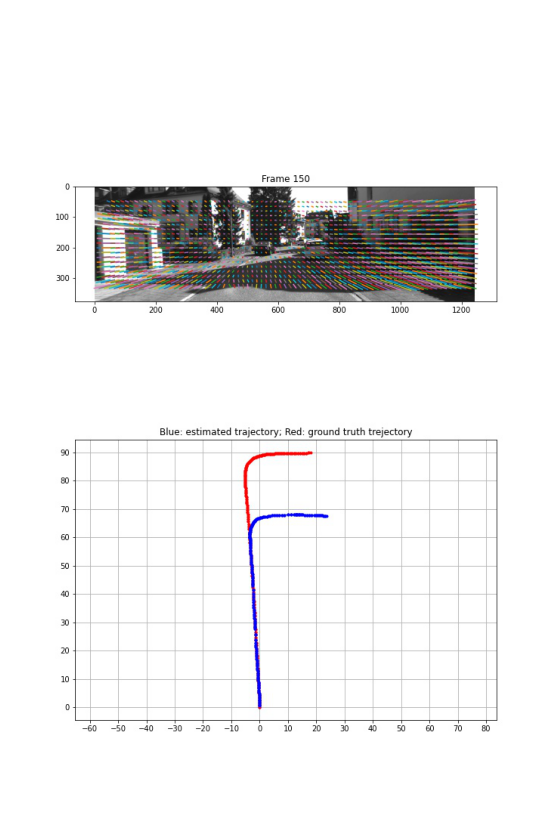

(1463, 4)
[[-0.0011  0.1832  0.9831 24.3012]
 [ 0.084   0.9796 -0.1824 -6.3684]
 [-0.9965  0.0824 -0.0165 67.6937]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00455
Mean Error Translation: 0.90611
== [Result] Frame: 151, Matches 1463, Inliers: 96.51


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame151.jpg
(1463, 4)
[[-0.0024  0.1887  0.982  24.8795]
 [ 0.0766  0.9792 -0.188  -6.4793]
 [-0.9971  0.0748 -0.0168 67.7205]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00454
Mean Error Translation: 0.90176
== [Result] Frame: 152, Matches 1463, Inliers: 96.38


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame152.jpg
(1463, 4)
[[-0.0025  0.192   0.9814 25.482 ]
 [ 0.0752  0.9786 -0.1913 -6.5946]
 [-0.9972  0.0733 -0.0169 67.7256]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00453
Mean Error Translation: 0.89738
== [Result] Frame: 153, Matches 1463, Inliers: 93.44


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame153.jpg
(1463, 4)
[[-0.0041  0.1918  0.9814 26.0687]
 [ 0.072   0.9789 -0.1911 -6.7144]
 [-0.9974  0.0699 -0.0178 67.7413]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00451
Mean Error Translation: 0.89316
== [Result] Frame: 154, Matches 1463, Inliers: 88.59


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame154.jpg
(1463, 4)
[[-0.0026  0.1901  0.9818 26.6713]
 [ 0.072   0.9793 -0.1894 -6.8404]
 [-0.9974  0.0702 -0.0163 67.7266]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00451
Mean Error Translation: 0.88895
== [Result] Frame: 155, Matches 1463, Inliers: 90.64


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame155.jpg
(1463, 4)
[[-0.0003  0.1892  0.9819 27.2965]
 [ 0.0768  0.979  -0.1886 -6.9687]
 [-0.997   0.0753 -0.0148 67.7049]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00453
Mean Error Translation: 0.88467
== [Result] Frame: 156, Matches 1463, Inliers: 96.17


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame156.jpg
(1463, 4)
[[ 0.0009  0.1881  0.9821 27.9184]
 [ 0.0768  0.9792 -0.1876 -7.1028]
 [-0.997   0.0756 -0.0135 67.697 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00452
Mean Error Translation: 0.88046
== [Result] Frame: 157, Matches 1463, Inliers: 94.19


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame157.jpg
(1463, 4)
[[ 0.0021  0.1886  0.9821 28.5438]
 [ 0.0778  0.979  -0.1882 -7.2329]
 [-0.997   0.0768 -0.0126 67.6878]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00452
Mean Error Translation: 0.87625
== [Result] Frame: 158, Matches 1463, Inliers: 94.87


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame158.jpg
(1463, 4)
[[ 0.0036  0.1886  0.982  29.1611]
 [ 0.0775  0.979  -0.1883 -7.367 ]
 [-0.997   0.0768 -0.0111 67.6754]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00452
Mean Error Translation: 0.87215
== [Result] Frame: 159, Matches 1463, Inliers: 96.65


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame159.jpg
(1463, 4)
[[ 0.0044  0.1895  0.9819 29.783 ]
 [ 0.077   0.9789 -0.1893 -7.4991]
 [-0.997   0.0764 -0.0102 67.6554]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00452
Mean Error Translation: 0.86807
== [Result] Frame: 160, Matches 1463, Inliers: 97.27


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame160.jpg
(1463, 4)
[[ 0.0024  0.1891  0.9819 30.4609]
 [ 0.0742  0.9792 -0.1888 -7.6392]
 [-0.9972  0.0733 -0.0117 67.643 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00451
Mean Error Translation: 0.86378
== [Result] Frame: 161, Matches 1463, Inliers: 96.10


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame161.jpg
(1463, 4)
[[-0.0002  0.1876  0.9822 31.3267]
 [ 0.0724  0.9797 -0.1871 -7.8211]
 [-0.9974  0.0711 -0.0138 67.6255]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00449
Mean Error Translation: 0.85946
== [Result] Frame: 162, Matches 1463, Inliers: 96.58


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame162.jpg
(1463, 4)
[[-0.0044  0.1851  0.9827 32.28  ]
 [ 0.0692  0.9804 -0.1844 -8.0193]
 [-0.9976  0.0672 -0.0171 67.6076]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00449
Mean Error Translation: 0.85554
== [Result] Frame: 163, Matches 1463, Inliers: 95.97


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame163.jpg
(1463, 4)
[[-0.0105  0.1828  0.9831 33.4274]
 [ 0.0676  0.981  -0.1817 -8.2644]
 [-0.9977  0.0645 -0.0227 67.5903]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00447
Mean Error Translation: 0.85274
== [Result] Frame: 164, Matches 1463, Inliers: 87.15


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame164.jpg
(1463, 4)
[[-0.0169  0.183   0.983  34.6635]
 [ 0.07    0.9809 -0.1814 -8.5244]
 [-0.9974  0.0657 -0.0294 67.548 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00446
Mean Error Translation: 0.85053
== [Result] Frame: 165, Matches 1463, Inliers: 88.45


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame165.jpg
(1463, 4)
[[-0.0254  0.1835  0.9827 35.9825]
 [ 0.0704  0.9809 -0.1814 -8.8031]
 [-0.9972  0.0646 -0.0378 67.5012]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00444
Mean Error Translation: 0.84887
== [Result] Frame: 166, Matches 1463, Inliers: 91.66


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame166.jpg
(1463, 4)
[[-0.0353  0.1841  0.9823 37.131 ]
 [ 0.0714  0.9808 -0.1813 -9.0316]
 [-0.9968  0.0637 -0.0478 67.4483]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.84620
== [Result] Frame: 167, Matches 1463, Inliers: 87.35


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame167.jpg
(1463, 4)
[[-0.0464  0.1841  0.9818 38.4614]
 [ 0.0726  0.9809 -0.1805 -9.2864]
 [-0.9963  0.0629 -0.0588 67.3901]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00441
Mean Error Translation: 0.84461
== [Result] Frame: 168, Matches 1463, Inliers: 84.89


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame168.jpg
(1463, 4)
[[-0.0572  0.183   0.9815 39.5506]
 [ 0.0728  0.9812 -0.1787 -9.5075]
 [-0.9957  0.0613 -0.0695 67.318 ]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.84172
== [Result] Frame: 169, Matches 1463, Inliers: 89.54


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame169.jpg
(1463, 4)
[[-0.0682  0.1823  0.9809 40.6583]
 [ 0.0757  0.9813 -0.1771 -9.7291]
 [-0.9948  0.0622 -0.0807 67.2324]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00437
Mean Error Translation: 0.83897
== [Result] Frame: 170, Matches 1463, Inliers: 92.69


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame170.jpg
(1463, 4)
[[-0.0789  0.1827  0.98   41.9429]
 [ 0.0766  0.9813 -0.1768 -9.9811]
 [-0.9939  0.0611 -0.0915 67.1096]
 [ 0.      0.      0.      1.    ]]
Mean Error Rotation: 0.00436
Mean Error Translation: 0.83730
== [Result] Frame: 171, Matches 1463, Inliers: 93.16


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame171.jpg
(1463, 4)
[[ -0.09     0.1832   0.979   43.2973]
 [  0.0781   0.9812  -0.1764 -10.2556]
 [ -0.9929   0.0606  -0.1026  66.9679]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00433
Mean Error Translation: 0.83612
== [Result] Frame: 172, Matches 1463, Inliers: 85.92


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame172.jpg
(1463, 4)
[[ -0.1004   0.1844   0.9777  44.7698]
 [  0.0792   0.981   -0.1769 -10.5455]
 [ -0.9918   0.0597  -0.1131  66.8055]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00431
Mean Error Translation: 0.83564
== [Result] Frame: 173, Matches 1463, Inliers: 81.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame173.jpg
(1463, 4)
[[ -0.111    0.1861   0.9762  46.3895]
 [  0.081    0.9807  -0.1777 -10.8511]
 [ -0.9905   0.0593  -0.124   66.6076]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00430
Mean Error Translation: 0.83606
== [Result] Frame: 174, Matches 1463, Inliers: 76.76


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame174.jpg
(1463, 4)
[[ -0.1221   0.1873   0.9747  47.9009]
 [  0.0811   0.9806  -0.1783 -11.1385]
 [ -0.9892   0.0572  -0.1349  66.4344]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00430
Mean Error Translation: 0.83587
== [Result] Frame: 175, Matches 1463, Inliers: 78.67


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame175.jpg
(1463, 4)
[[ -0.1311   0.188    0.9734  49.0974]
 [  0.0839   0.9804  -0.178  -11.3768]
 [ -0.9878   0.0583  -0.1444  66.2514]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00428
Mean Error Translation: 0.83398
== [Result] Frame: 176, Matches 1463, Inliers: 84.69


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame176.jpg
(1463, 4)
[[ -0.1395   0.1888   0.9721  50.1829]
 [  0.0876   0.9802  -0.1778 -11.5924]
 [ -0.9863   0.0604  -0.1532  66.0702]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.83156
== [Result] Frame: 177, Matches 1463, Inliers: 88.52


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame177.jpg
(1463, 4)
[[ -0.1486   0.1886   0.9707  50.8552]
 [  0.0897   0.9802  -0.1767 -11.725 ]
 [ -0.9848   0.0608  -0.1626  65.9709]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.82757
== [Result] Frame: 178, Matches 1463, Inliers: 91.46


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame178.jpg
(1463, 4)
[[ -0.1531   0.1884   0.9701  51.6097]
 [  0.0966   0.9798  -0.175  -11.8774]
 [ -0.9835   0.0669  -0.1682  65.8115]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.82376
== [Result] Frame: 179, Matches 1463, Inliers: 95.28


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame179.jpg
(1463, 4)
[[ -0.1588   0.1871   0.9694  52.3554]
 [  0.0998   0.9799  -0.1728 -12.0253]
 [ -0.9822   0.0693  -0.1743  65.6906]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.81988
== [Result] Frame: 180, Matches 1463, Inliers: 96.31


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame180.jpg
(1463, 4)
[[ -0.1647   0.186    0.9687  52.8389]
 [  0.1005   0.9801  -0.1711 -12.117 ]
 [ -0.9812   0.0691  -0.1801  65.6199]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.81667
== [Result] Frame: 181, Matches 1463, Inliers: 97.47


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame181.jpg
(1463, 4)
[[ -0.1696   0.1849   0.968   53.3307]
 [  0.0999   0.9804  -0.1698 -12.2112]
 [ -0.9804   0.0679  -0.1847  65.5494]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.81340
== [Result] Frame: 182, Matches 1463, Inliers: 91.93


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame182.jpg
(1463, 4)
[[ -0.1718   0.1846   0.9677  53.796 ]
 [  0.0998   0.9805  -0.1693 -12.2981]
 [ -0.9801   0.0675  -0.1869  65.4654]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00425
Mean Error Translation: 0.81020
== [Result] Frame: 183, Matches 1463, Inliers: 94.12


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame183.jpg
(1463, 4)
[[ -0.1708   0.1857   0.9676  54.2474]
 [  0.1014   0.9802  -0.1703 -12.3865]
 [ -0.9801   0.069   -0.1863  65.3614]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00425
Mean Error Translation: 0.80705
== [Result] Frame: 184, Matches 1463, Inliers: 92.75


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame184.jpg
(1463, 4)
[[ -0.1695   0.1872   0.9676  54.6889]
 [  0.1023   0.9798  -0.1717 -12.4721]
 [ -0.9802   0.0698  -0.1852  65.2748]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00423
Mean Error Translation: 0.80389
== [Result] Frame: 185, Matches 1463, Inliers: 99.38


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame185.jpg
(1463, 4)
[[ -0.1667   0.1895   0.9676  55.1181]
 [  0.1028   0.9794  -0.174  -12.5535]
 [ -0.9806   0.0705  -0.1828  65.1988]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00421
Mean Error Translation: 0.80073
== [Result] Frame: 186, Matches 1463, Inliers: 99.04


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame186.jpg
(1463, 4)
[[ -0.1637   0.1902   0.968   55.5469]
 [  0.1005   0.9794  -0.1754 -12.6373]
 [ -0.9814   0.0686  -0.1794  65.1385]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00421
Mean Error Translation: 0.79753
== [Result] Frame: 187, Matches 1463, Inliers: 98.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame187.jpg
(1463, 4)
[[ -0.156    0.1913   0.969   55.9597]
 [  0.0993   0.9791  -0.1773 -12.7193]
 [ -0.9828   0.0685  -0.1717  65.073 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00420
Mean Error Translation: 0.79434
== [Result] Frame: 188, Matches 1463, Inliers: 97.95


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame188.jpg
(1463, 4)
[[ -0.1457   0.1914   0.9706  56.355 ]
 [  0.0966   0.9792  -0.1786 -12.8015]
 [ -0.9846   0.0677  -0.1611  65.0166]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00417
Mean Error Translation: 0.79117
== [Result] Frame: 189, Matches 1463, Inliers: 98.22


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame189.jpg
(1463, 4)
[[ -0.1335   0.1918   0.9723  56.7369]
 [  0.0928   0.9792  -0.1804 -12.8836]
 [ -0.9867   0.0661  -0.1486  64.9776]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00416
Mean Error Translation: 0.78800
== [Result] Frame: 190, Matches 1463, Inliers: 97.54


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame190.jpg
(1463, 4)
[[ -0.1173   0.1932   0.9741  57.1082]
 [  0.0887   0.979   -0.1835 -12.9638]
 [ -0.9891   0.0649  -0.132   64.9426]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00415
Mean Error Translation: 0.78483
== [Result] Frame: 191, Matches 1463, Inliers: 97.27


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame191.jpg
(1463, 4)
[[ -0.0964   0.1959   0.9759  57.4624]
 [  0.0848   0.9785  -0.188  -13.0401]
 [ -0.9917   0.0646  -0.1109  64.912 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00413
Mean Error Translation: 0.78172
== [Result] Frame: 192, Matches 1463, Inliers: 97.61


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame192.jpg
(1463, 4)
[[ -0.07     0.1995   0.9774  57.8074]
 [  0.0825   0.9776  -0.1936 -13.1111]
 [ -0.9941   0.0671  -0.0849  64.8778]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00415
Mean Error Translation: 0.77867
== [Result] Frame: 193, Matches 1463, Inliers: 96.51


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame193.jpg
(1463, 4)
[[ -0.0401   0.2014   0.9787  58.1411]
 [  0.0785   0.9771  -0.1979 -13.1833]
 [ -0.9961   0.0689  -0.055   64.8585]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00416
Mean Error Translation: 0.77567
== [Result] Frame: 194, Matches 1463, Inliers: 95.83


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame194.jpg
(1463, 4)
[[ -0.0085   0.201    0.9795  58.4582]
 [  0.07     0.9773  -0.2    -13.2532]
 [ -0.9975   0.0669  -0.0224  64.8722]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.77278
== [Result] Frame: 195, Matches 1463, Inliers: 93.78


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame195.jpg
(1463, 4)
[[  0.0268   0.1992   0.9796  58.7775]
 [  0.0603   0.9778  -0.2004 -13.3222]
 [ -0.9978   0.0644   0.0142  64.9068]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.76989
== [Result] Frame: 196, Matches 1463, Inliers: 91.80


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame196.jpg
(1463, 4)
[[  0.0687   0.1951   0.9784  59.088 ]
 [  0.051    0.9787  -0.1988 -13.3996]
 [ -0.9963   0.0635   0.0573  64.9415]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00413
Mean Error Translation: 0.76703
== [Result] Frame: 197, Matches 1463, Inliers: 92.62


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame197.jpg
(1463, 4)
[[  0.1139   0.1908   0.975   59.4075]
 [  0.0417   0.9796  -0.1965 -13.4726]
 [ -0.9926   0.063    0.1036  64.9887]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00413
Mean Error Translation: 0.76416
== [Result] Frame: 198, Matches 1463, Inliers: 96.24


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame198.jpg
(1463, 4)
[[  0.161    0.1875   0.969   59.7268]
 [  0.0281   0.9805  -0.1944 -13.5462]
 [ -0.9866   0.0586   0.1525  65.0625]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00411
Mean Error Translation: 0.76129
== [Result] Frame: 199, Matches 1463, Inliers: 93.10


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame199.jpg
(1463, 4)
[[  0.2106   0.1867   0.9596  60.0421]
 [  0.0142   0.9809  -0.1939 -13.6167]
 [ -0.9775   0.0544   0.204   65.1633]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00410
Mean Error Translation: 0.75834
== [Result] Frame: 200, Matches 1463, Inliers: 98.15


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame200.jpg


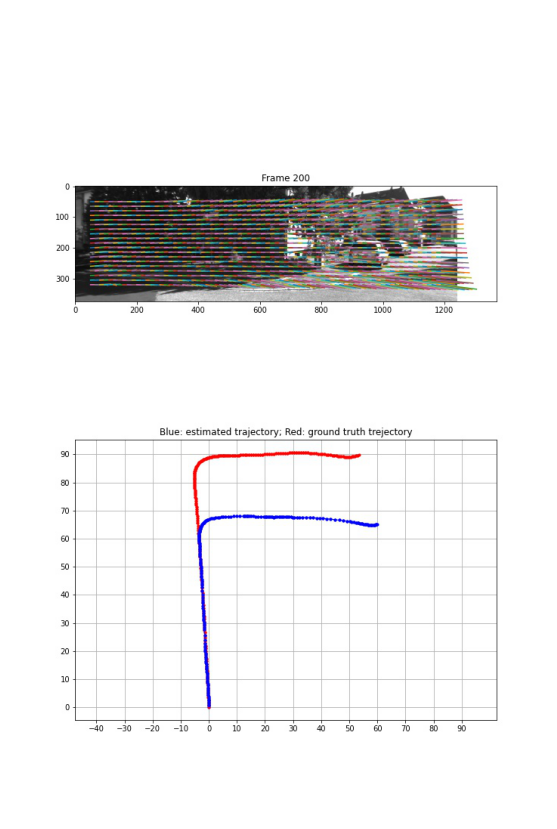

(1463, 4)
[[  0.2657   0.1864   0.9459  60.3574]
 [  0.0038   0.9809  -0.1944 -13.6892]
 [ -0.9641   0.0552   0.2599  65.2764]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00409
Mean Error Translation: 0.75542
== [Result] Frame: 201, Matches 1463, Inliers: 97.54


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame201.jpg
(1463, 4)
[[  0.3205   0.1893   0.9281  60.6598]
 [ -0.0104   0.9805  -0.1964 -13.7629]
 [ -0.9472   0.0533   0.3162  65.4362]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00412
Mean Error Translation: 0.75247
== [Result] Frame: 202, Matches 1463, Inliers: 89.47


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame202.jpg
(1463, 4)
[[  0.3787   0.1946   0.9048  60.942 ]
 [ -0.0239   0.9794  -0.2006 -13.8324]
 [ -0.9252   0.0543   0.3755  65.6076]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00412
Mean Error Translation: 0.74946
== [Result] Frame: 203, Matches 1463, Inliers: 97.81


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame203.jpg
(1463, 4)
[[  0.4396   0.1978   0.8761  61.2158]
 [ -0.0343   0.9784  -0.2037 -13.9047]
 [ -0.8975   0.0595   0.437   65.7793]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00410
Mean Error Translation: 0.74659
== [Result] Frame: 204, Matches 1463, Inliers: 95.83


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame204.jpg
(1463, 4)
[[  0.4928   0.2061   0.8454  61.4526]
 [ -0.0553   0.977   -0.2059 -13.9778]
 [ -0.8684   0.0547   0.4928  66.0372]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.74359
== [Result] Frame: 205, Matches 1463, Inliers: 91.39


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame205.jpg
(1463, 4)
[[  0.5458   0.211    0.8109  61.6947]
 [ -0.0736   0.9761  -0.2044 -14.0517]
 [ -0.8347   0.0519   0.5483  66.3042]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.74060
== [Result] Frame: 206, Matches 1463, Inliers: 94.19


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame206.jpg
(1463, 4)
[[  0.596    0.2154   0.7735  61.909 ]
 [ -0.0902   0.9752  -0.2021 -14.1231]
 [ -0.7979   0.0507   0.6007  66.6026]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00417
Mean Error Translation: 0.73764
== [Result] Frame: 207, Matches 1463, Inliers: 88.59


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame207.jpg
(1463, 4)
[[  0.645    0.2169   0.7327  62.1228]
 [ -0.1058   0.975   -0.1954 -14.2002]
 [ -0.7568   0.0485   0.6518  66.8929]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00418
Mean Error Translation: 0.73460
== [Result] Frame: 208, Matches 1463, Inliers: 89.47


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame208.jpg
(1463, 4)
[[  0.6929   0.2129   0.6889  62.3289]
 [ -0.1179   0.976   -0.183  -14.2646]
 [ -0.7113   0.0455   0.7014  67.1671]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00416
Mean Error Translation: 0.73175
== [Result] Frame: 209, Matches 1463, Inliers: 88.11


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame209.jpg
(1463, 4)
[[  0.7375   0.2076   0.6427  62.4908]
 [ -0.1285   0.9773  -0.1683 -14.3134]
 [ -0.663    0.0415   0.7474  67.4239]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00415
Mean Error Translation: 0.72909
== [Result] Frame: 210, Matches 1463, Inliers: 85.24


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame210.jpg
(1463, 4)
[[  0.7758   0.2082   0.5957  62.6191]
 [ -0.1434   0.9775  -0.1549 -14.3537]
 [ -0.6145   0.0347   0.7881  67.6895]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00416
Mean Error Translation: 0.72641
== [Result] Frame: 211, Matches 1463, Inliers: 82.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame211.jpg
(1463, 4)
[[  0.8084   0.2089   0.5504  62.7194]
 [ -0.1568   0.9776  -0.1406 -14.3889]
 [ -0.5674   0.0274   0.823   67.953 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00417
Mean Error Translation: 0.72392
== [Result] Frame: 212, Matches 1463, Inliers: 90.77


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame212.jpg
(1463, 4)
[[  0.8342   0.2147   0.5079  62.8491]
 [ -0.1727   0.9765  -0.129  -14.4413]
 [ -0.5237   0.0199   0.8517  68.3675]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00420
Mean Error Translation: 0.72080
== [Result] Frame: 213, Matches 1463, Inliers: 95.42


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame213.jpg
(1463, 4)
[[  0.8555   0.2203   0.4686  62.9863]
 [ -0.1856   0.9753  -0.1196 -14.4911]
 [ -0.4834   0.0153   0.8753  68.8   ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00422
Mean Error Translation: 0.71759
== [Result] Frame: 214, Matches 1463, Inliers: 95.90


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame214.jpg
(1463, 4)
[[  0.8733   0.2244   0.4324  63.1346]
 [ -0.1963   0.9744  -0.1093 -14.5506]
 [ -0.4459   0.0106   0.895   69.2091]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00421
Mean Error Translation: 0.71462
== [Result] Frame: 215, Matches 1463, Inliers: 92.82


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame215.jpg
(1463, 4)
[[  0.8876   0.229    0.3996  63.2775]
 [ -0.2044   0.9734  -0.1038 -14.6007]
 [ -0.4127   0.0104   0.9108  69.6367]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00420
Mean Error Translation: 0.71160
== [Result] Frame: 216, Matches 1463, Inliers: 95.01


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame216.jpg
(1463, 4)
[[  0.9003   0.2297   0.3698  63.4467]
 [ -0.2081   0.9732  -0.0979 -14.6505]
 [ -0.3824   0.0111   0.9239  70.0917]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00419
Mean Error Translation: 0.70865
== [Result] Frame: 217, Matches 1463, Inliers: 96.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame217.jpg
(1463, 4)
[[  0.9101   0.2243   0.3485  63.6304]
 [ -0.2042   0.9744  -0.0938 -14.7069]
 [ -0.3607   0.0141   0.9326  70.5896]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00417
Mean Error Translation: 0.70576
== [Result] Frame: 218, Matches 1463, Inliers: 98.56


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame218.jpg
(1463, 4)
[[  0.9173   0.2189   0.3326  63.8368]
 [ -0.2002   0.9756  -0.09   -14.7772]
 [ -0.3442   0.016    0.9388  71.1423]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00417
Mean Error Translation: 0.70312
== [Result] Frame: 219, Matches 1463, Inliers: 99.04


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame219.jpg
(1463, 4)
[[  0.9222   0.2191   0.3186  64.064 ]
 [ -0.2015   0.9756  -0.0876 -14.8499]
 [ -0.33     0.0166   0.9438  71.7692]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00419
Mean Error Translation: 0.70078
== [Result] Frame: 220, Matches 1463, Inliers: 99.86


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame220.jpg
(1463, 4)
[[  0.9258   0.2202   0.3072  64.3095]
 [ -0.204    0.9753  -0.0844 -14.9304]
 [ -0.3182   0.0155   0.9479  72.4692]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00420
Mean Error Translation: 0.69874
== [Result] Frame: 221, Matches 1463, Inliers: 96.38


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame221.jpg
(1463, 4)
[[  0.9269   0.2244   0.3007  64.5326]
 [ -0.2087   0.9744  -0.0839 -15.0125]
 [ -0.3118   0.015    0.95    73.2129]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00420
Mean Error Translation: 0.69680
== [Result] Frame: 222, Matches 1463, Inliers: 96.10


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame222.jpg
(1463, 4)
[[  0.927    0.2298   0.2965  64.7765]
 [ -0.2134   0.9731  -0.0868 -15.0981]
 [ -0.3084   0.0172   0.9511  74.0384]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00419
Mean Error Translation: 0.69518
== [Result] Frame: 223, Matches 1463, Inliers: 92.89


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame223.jpg
(1463, 4)
[[  0.9277   0.2298   0.2943  65.054 ]
 [ -0.2127   0.973   -0.0891 -15.2001]
 [ -0.3068   0.02     0.9516  74.9025]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00418
Mean Error Translation: 0.69376
== [Result] Frame: 224, Matches 1463, Inliers: 94.53


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame224.jpg
(1463, 4)
[[  0.9282   0.227    0.2948  65.3505]
 [ -0.2086   0.9736  -0.0931 -15.3002]
 [ -0.3082   0.0249   0.951   75.772 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00418
Mean Error Translation: 0.69235
== [Result] Frame: 225, Matches 1463, Inliers: 92.48


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame225.jpg
(1463, 4)
[[  0.9272   0.228    0.2972  65.5753]
 [ -0.2071   0.9732  -0.1003 -15.3742]
 [ -0.3121   0.0314   0.9495  76.5038]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00418
Mean Error Translation: 0.69023
== [Result] Frame: 226, Matches 1463, Inliers: 88.17


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame226.jpg
(1463, 4)
[[  0.9263   0.2277   0.3003  65.7955]
 [ -0.205    0.9731  -0.1055 -15.4492]
 [ -0.3162   0.0362   0.948   77.2021]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00417
Mean Error Translation: 0.68794
== [Result] Frame: 227, Matches 1463, Inliers: 93.44


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame227.jpg
(1463, 4)
[[  0.9242   0.2325   0.3031  65.9906]
 [ -0.21     0.972   -0.1055 -15.5231]
 [ -0.3191   0.0338   0.9471  77.7844]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00416
Mean Error Translation: 0.68527
== [Result] Frame: 228, Matches 1463, Inliers: 85.92


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame228.jpg
(1463, 4)
[[  0.9207   0.2363   0.3107  66.1336]
 [ -0.2147   0.9713  -0.1027 -15.5805]
 [ -0.326    0.0279   0.945   78.3123]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00415
Mean Error Translation: 0.68258
== [Result] Frame: 229, Matches 1463, Inliers: 92.28


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame229.jpg
(1463, 4)
[[  0.9197   0.2336   0.3156  66.3146]
 [ -0.2128   0.972   -0.0992 -15.6418]
 [ -0.33     0.0241   0.9437  78.8291]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.68003
== [Result] Frame: 230, Matches 1463, Inliers: 93.71


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame230.jpg
(1463, 4)
[[  0.9186   0.2309   0.3209  66.4768]
 [ -0.2114   0.9728  -0.0947 -15.6967]
 [ -0.334    0.0191   0.9424  79.3228]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.67761
== [Result] Frame: 231, Matches 1463, Inliers: 94.87


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame231.jpg
(1463, 4)
[[  0.9165   0.2314   0.3263  66.6585]
 [ -0.2132   0.9727  -0.0912 -15.7612]
 [ -0.3385   0.014    0.9409  79.9073]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00414
Mean Error Translation: 0.67494
== [Result] Frame: 232, Matches 1463, Inliers: 96.58


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame232.jpg
(1463, 4)
[[  0.9149   0.2316   0.3305  66.8655]
 [ -0.2133   0.9727  -0.0912 -15.8352]
 [ -0.3426   0.0129   0.9394  80.577 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00416
Mean Error Translation: 0.67237
== [Result] Frame: 233, Matches 1463, Inliers: 94.26


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame233.jpg
(1463, 4)
[[  0.9137   0.2344   0.3319  67.0939]
 [ -0.2149   0.972   -0.0949 -15.911 ]
 [ -0.3449   0.0154   0.9385  81.3286]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00418
Mean Error Translation: 0.67008
== [Result] Frame: 234, Matches 1463, Inliers: 91.18


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame234.jpg
(1463, 4)
[[  0.9131   0.2384   0.3308  67.365 ]
 [ -0.2165   0.9709  -0.1021 -15.998 ]
 [ -0.3455   0.0216   0.9382  82.1541]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00419
Mean Error Translation: 0.66815
== [Result] Frame: 235, Matches 1463, Inliers: 92.55


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame235.jpg
(1463, 4)
[[  0.9112   0.2466   0.3299  67.6528]
 [ -0.2227   0.9688  -0.109  -16.094 ]
 [ -0.3465   0.0259   0.9377  83.1103]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00421
Mean Error Translation: 0.66672
== [Result] Frame: 236, Matches 1463, Inliers: 93.98


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame236.jpg
(1463, 4)
[[  0.9091   0.2558   0.3287  67.9526]
 [ -0.231    0.9664  -0.113  -16.1919]
 [ -0.3466   0.0268   0.9376  84.1578]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00423
Mean Error Translation: 0.66561
== [Result] Frame: 237, Matches 1463, Inliers: 90.23


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame237.jpg
(1463, 4)
[[  0.9105   0.2529   0.3272  68.3187]
 [ -0.2297   0.9672  -0.1084 -16.3173]
 [ -0.3439   0.0236   0.9387  85.1555]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00422
Mean Error Translation: 0.66438
== [Result] Frame: 238, Matches 1463, Inliers: 86.26


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame238.jpg
(1463, 4)
[[  0.9109   0.25     0.3284  68.6545]
 [ -0.2293   0.9681  -0.101  -16.4401]
 [ -0.3432   0.0167   0.9391  86.1534]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00422
Mean Error Translation: 0.66304
== [Result] Frame: 239, Matches 1463, Inliers: 83.73


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame239.jpg
(1463, 4)
[[  0.9093   0.254    0.3298  68.9395]
 [ -0.2354   0.9672  -0.0959 -16.5486]
 [ -0.3433   0.0096   0.9392  87.1377]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00423
Mean Error Translation: 0.66151
== [Result] Frame: 240, Matches 1463, Inliers: 89.61


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame240.jpg
(1463, 4)
[[  0.9077   0.2597   0.3296  69.2792]
 [ -0.2411   0.9657  -0.0967 -16.6749]
 [ -0.3433   0.0083   0.9392  88.2676]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00423
Mean Error Translation: 0.66064
== [Result] Frame: 241, Matches 1463, Inliers: 90.84


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame241.jpg
(1463, 4)
[[  0.9068   0.2652   0.3277  69.6107]
 [ -0.2454   0.9641  -0.1012 -16.7903]
 [ -0.3428   0.0114   0.9393  89.336 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00422
Mean Error Translation: 0.65951
== [Result] Frame: 242, Matches 1463, Inliers: 93.37


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame242.jpg
(1463, 4)
[[  0.9057   0.2713   0.3258  69.9692]
 [ -0.2497   0.9624  -0.1071 -16.9126]
 [ -0.3426   0.0156   0.9394  90.6768]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00424
Mean Error Translation: 0.65940
== [Result] Frame: 243, Matches 1463, Inliers: 88.45


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame243.jpg
(1463, 4)
[[  0.9053   0.2752   0.3235  70.3352]
 [ -0.2527   0.9612  -0.1105 -17.0286]
 [ -0.3413   0.0183   0.9398  91.9324]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00425
Mean Error Translation: 0.65893
== [Result] Frame: 244, Matches 1463, Inliers: 89.47


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame244.jpg
(1463, 4)
[[  0.9092   0.268    0.3186  70.7534]
 [ -0.2459   0.9632  -0.1084 -17.1732]
 [ -0.3359   0.0202   0.9417  93.0109]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.65790
== [Result] Frame: 245, Matches 1463, Inliers: 87.83


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame245.jpg
(1463, 4)
[[  0.9111   0.2644   0.3161  71.0557]
 [ -0.2431   0.9642  -0.1059 -17.2895]
 [ -0.3328   0.0197   0.9428  93.9211]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.65603
== [Result] Frame: 246, Matches 1463, Inliers: 87.42


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame246.jpg
(1463, 4)
[[  0.9111   0.2647   0.3159  71.3751]
 [ -0.2444   0.9642  -0.1031 -17.4178]
 [ -0.3319   0.0168   0.9432  94.9541]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.65456
== [Result] Frame: 247, Matches 1463, Inliers: 81.07


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame247.jpg
(1463, 4)
[[  0.9155   0.2528   0.313   71.8235]
 [ -0.2329   0.9673  -0.1001 -17.5854]
 [ -0.3281   0.0187   0.9445  96.1377]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00430
Mean Error Translation: 0.65384
== [Result] Frame: 248, Matches 1463, Inliers: 82.02


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame248.jpg
(1463, 4)
[[  0.9162   0.2491   0.3139  72.2576]
 [ -0.2293   0.9683  -0.0989 -17.7522]
 [ -0.3286   0.0186   0.9443  97.5176]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00429
Mean Error Translation: 0.65377
== [Result] Frame: 249, Matches 1463, Inliers: 78.13


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame249.jpg
(1463, 4)
[[  0.9157   0.2506   0.3143  72.7343]
 [ -0.2314   0.9679  -0.0976 -17.9222]
 [ -0.3287   0.0166   0.9443  99.0624]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00428
Mean Error Translation: 0.65433
== [Result] Frame: 250, Matches 1463, Inliers: 78.81


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame250.jpg


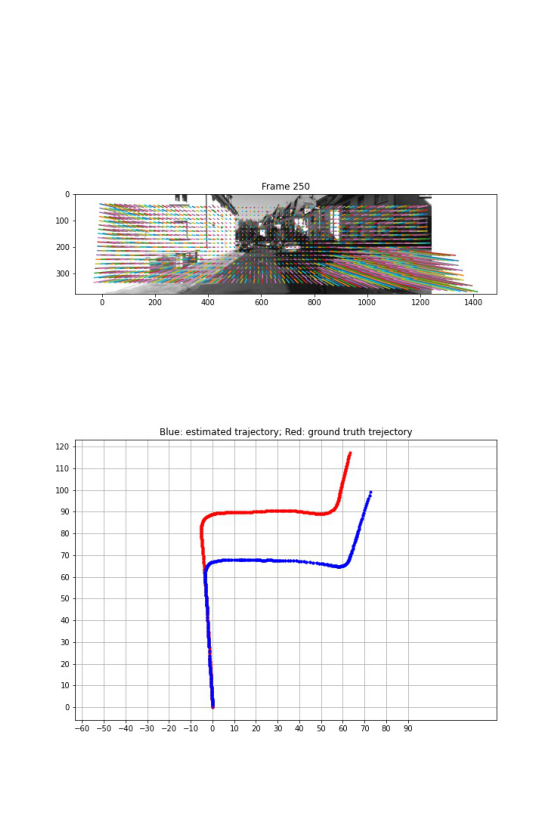

(1463, 4)
[[  0.9151   0.2531   0.3138  73.2595]
 [ -0.2333   0.9673  -0.0998 -18.1116]
 [ -0.3288   0.0181   0.9442 100.6272]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00428
Mean Error Translation: 0.65506
== [Result] Frame: 251, Matches 1463, Inliers: 80.79


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame251.jpg
(1463, 4)
[[  0.9127   0.2605   0.3147  73.4082]
 [ -0.2399   0.9653  -0.1034 -18.1729]
 [ -0.3307   0.0189   0.9435 101.1544]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.65365
== [Result] Frame: 252, Matches 1463, Inliers: 85.65


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame252.jpg
(1463, 4)
[[  0.9096   0.2709   0.3152  73.5691]
 [ -0.2501   0.9625  -0.1054 -18.2315]
 [ -0.3319   0.017    0.9432 101.6888]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00428
Mean Error Translation: 0.65224
== [Result] Frame: 253, Matches 1463, Inliers: 89.13


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame253.jpg
(1463, 4)
[[  0.9068   0.2753   0.3193  73.738 ]
 [ -0.2544   0.9612  -0.1065 -18.291 ]
 [ -0.3362   0.0154   0.9417 102.2548]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00428
Mean Error Translation: 0.65075
== [Result] Frame: 254, Matches 1463, Inliers: 95.49


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame254.jpg
(1463, 4)
[[  0.9043   0.278    0.3239  73.919 ]
 [ -0.2571   0.9605  -0.1066 -18.3543]
 [ -0.3407   0.0131   0.9401 102.8542]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.64914
== [Result] Frame: 255, Matches 1463, Inliers: 89.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame255.jpg
(1463, 4)
[[  0.9036   0.2774   0.3265  74.1138]
 [ -0.2556   0.9607  -0.1088 -18.4207]
 [ -0.3438   0.0149   0.9389 103.4419]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.64759
== [Result] Frame: 256, Matches 1463, Inliers: 91.87


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame256.jpg
(1463, 4)
[[  0.902    0.278    0.3302  74.2878]
 [ -0.2546   0.9604  -0.1131 -18.4865]
 [ -0.3486   0.0179   0.9371 104.0378]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00427
Mean Error Translation: 0.64604
== [Result] Frame: 257, Matches 1463, Inliers: 94.26


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame257.jpg
(1463, 4)
[[  0.9031   0.2708   0.3332  74.4829]
 [ -0.2471   0.9624  -0.1125 -18.566 ]
 [ -0.3512   0.0192   0.9361 104.6151]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.64463
== [Result] Frame: 258, Matches 1463, Inliers: 92.34


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame258.jpg
(1463, 4)
[[  0.9043   0.2656   0.3342  74.6788]
 [ -0.2407   0.9638  -0.1147 -18.6424]
 [ -0.3526   0.0233   0.9355 105.1859]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.64323
== [Result] Frame: 259, Matches 1463, Inliers: 85.65


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame259.jpg
(1463, 4)
[[  0.9024   0.2677   0.3377  74.8511]
 [ -0.2425   0.9632  -0.1157 -18.7187]
 [ -0.3563   0.0225   0.9341 105.7455]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.64188
== [Result] Frame: 260, Matches 1463, Inliers: 83.53


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame260.jpg
(1463, 4)
[[  0.9009   0.269    0.3407  75.0514]
 [ -0.2443   0.9629  -0.1144 -18.7891]
 [ -0.3588   0.0198   0.9332 106.3304]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.64045
== [Result] Frame: 261, Matches 1463, Inliers: 83.25


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame261.jpg
(1463, 4)
[[  0.8985   0.2713   0.3451  75.2373]
 [ -0.2483   0.9624  -0.1101 -18.8598]
 [ -0.362    0.0133   0.9321 106.9184]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00426
Mean Error Translation: 0.63902
== [Result] Frame: 262, Matches 1463, Inliers: 87.49


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame262.jpg
(1463, 4)
[[  0.8993   0.2681   0.3455  75.4761]
 [ -0.2462   0.9633  -0.1067 -18.9448]
 [ -0.3614   0.0109   0.9323 107.5241]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00428
Mean Error Translation: 0.63754
== [Result] Frame: 263, Matches 1463, Inliers: 82.23


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame263.jpg
(1463, 4)
[[  0.9039   0.2574   0.3416  75.7608]
 [ -0.2319   0.966   -0.1142 -19.0401]
 [ -0.3594   0.024    0.9329 108.1625]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00434
Mean Error Translation: 0.63590
== [Result] Frame: 264, Matches 1463, Inliers: 79.90


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame264.jpg
(1463, 4)
[[  0.9077   0.2516   0.336   76.0573]
 [ -0.2206   0.9669  -0.1282 -19.151 ]
 [ -0.3571   0.0422   0.9331 108.8749]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00436
Mean Error Translation: 0.63403
== [Result] Frame: 265, Matches 1463, Inliers: 81.95


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame265.jpg
(1463, 4)
[[  0.9109   0.2467   0.3308  76.423 ]
 [ -0.2124   0.9676  -0.1368 -19.2849]
 [ -0.3538   0.0544   0.9337 109.7497]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00436
Mean Error Translation: 0.63234
== [Result] Frame: 266, Matches 1463, Inliers: 78.06


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame266.jpg
(1463, 4)
[[  0.9156   0.2333   0.3274  76.8566]
 [ -0.2016   0.971   -0.1283 -19.4342]
 [ -0.3479   0.0515   0.9361 110.7259]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00441
Mean Error Translation: 0.63105
== [Result] Frame: 267, Matches 1463, Inliers: 82.37


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame267.jpg
(1463, 4)
[[  0.9168   0.2235   0.331   77.2193]
 [ -0.1982   0.9741  -0.1088 -19.5795]
 [ -0.3467   0.0341   0.9373 111.7687]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.62971
== [Result] Frame: 268, Matches 1463, Inliers: 78.61


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame268.jpg
(1463, 4)
[[  0.9163   0.2197   0.3349  77.6239]
 [ -0.1993   0.9754  -0.0946 -19.7694]
 [ -0.3474   0.02     0.9375 113.0552]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.62927
== [Result] Frame: 269, Matches 1463, Inliers: 77.65


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame269.jpg
(1463, 4)
[[  0.9142   0.2282   0.3349  78.0345]
 [ -0.206    0.9733  -0.1007 -19.9492]
 [ -0.3489   0.0231   0.9369 114.4283]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00444
Mean Error Translation: 0.62925
== [Result] Frame: 270, Matches 1463, Inliers: 81.48


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame270.jpg
(1463, 4)
[[  0.9139   0.2374   0.3291  78.2436]
 [ -0.2102   0.9707  -0.1164 -20.0211]
 [ -0.3471   0.0372   0.9371 115.0329]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00443
Mean Error Translation: 0.62766
== [Result] Frame: 271, Matches 1463, Inliers: 85.92


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame271.jpg
(1463, 4)
[[  0.9136   0.2407   0.3278  78.4252]
 [ -0.211    0.9696  -0.1238 -20.1026]
 [ -0.3476   0.0439   0.9366 115.6241]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00443
Mean Error Translation: 0.62615
== [Result] Frame: 272, Matches 1463, Inliers: 83.19


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame272.jpg
(1463, 4)
[[  0.9144   0.2389   0.3267  78.6046]
 [ -0.2091   0.97    -0.124  -20.1855]
 [ -0.3466   0.0451   0.9369 116.1906]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.62474
== [Result] Frame: 273, Matches 1463, Inliers: 92.41


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame273.jpg
(1463, 4)
[[  0.9146   0.2388   0.3263  78.7835]
 [ -0.2096   0.9701  -0.1224 -20.2693]
 [ -0.3457   0.0436   0.9373 116.778 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.62330
== [Result] Frame: 274, Matches 1463, Inliers: 94.94


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame274.jpg
(1463, 4)
[[  0.9153   0.2392   0.324   79.0452]
 [ -0.2098   0.9699  -0.1235 -20.3804]
 [ -0.3438   0.045    0.938  117.6338]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.62150
== [Result] Frame: 275, Matches 1463, Inliers: 94.67


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame275.jpg
(1463, 4)
[[  0.9154   0.2428   0.321   79.3375]
 [ -0.2133   0.969   -0.1248 -20.5117]
 [ -0.3413   0.0458   0.9388 118.6097]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.62011
== [Result] Frame: 276, Matches 1463, Inliers: 94.87


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame276.jpg
(1463, 4)
[[  0.9153   0.2468   0.3183  79.6721]
 [ -0.2177   0.968   -0.1246 -20.6705]
 [ -0.3389   0.0447   0.9398 119.6625]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00441
Mean Error Translation: 0.61901
== [Result] Frame: 277, Matches 1463, Inliers: 86.53


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame277.jpg
(1463, 4)
[[  0.916    0.2495   0.3143  80.0629]
 [ -0.2207   0.9673  -0.1246 -20.8422]
 [ -0.3351   0.0447   0.9411 120.7547]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.61825
== [Result] Frame: 278, Matches 1463, Inliers: 86.19


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame278.jpg
(1463, 4)
[[  0.9181   0.246    0.3107  80.4644]
 [ -0.2179   0.9682  -0.1227 -21.0063]
 [ -0.331    0.045    0.9425 121.8481]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00444
Mean Error Translation: 0.61744
== [Result] Frame: 279, Matches 1463, Inliers: 83.25


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame279.jpg
(1463, 4)
[[  0.9188   0.2439   0.3103  80.7841]
 [ -0.2174   0.9689  -0.1179 -21.1498]
 [ -0.3295   0.0409   0.9433 122.8226]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.61614
== [Result] Frame: 280, Matches 1463, Inliers: 86.26


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame280.jpg
(1463, 4)
[[  0.9189   0.244    0.3098  81.0568]
 [ -0.2173   0.9689  -0.1185 -21.271 ]
 [ -0.3291   0.0416   0.9434 123.7231]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00442
Mean Error Translation: 0.61455
== [Result] Frame: 281, Matches 1463, Inliers: 84.07


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame281.jpg
(1463, 4)
[[  0.9209   0.2416   0.3059  81.4036]
 [ -0.2141   0.9693  -0.1212 -21.4231]
 [ -0.3258   0.0461   0.9443 124.7598]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00441
Mean Error Translation: 0.61352
== [Result] Frame: 282, Matches 1463, Inliers: 90.50


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame282.jpg
(1463, 4)
[[  0.9235   0.238    0.301   81.7264]
 [ -0.2096   0.9699  -0.1241 -21.5673]
 [ -0.3214   0.0516   0.9455 125.8012]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00440
Mean Error Translation: 0.61249
== [Result] Frame: 283, Matches 1463, Inliers: 84.21


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame283.jpg
(1463, 4)
[[  0.9266   0.2334   0.2949  82.1249]
 [ -0.2051   0.9709  -0.1239 -21.7461]
 [ -0.3152   0.0544   0.9475 127.0746]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.61228
== [Result] Frame: 284, Matches 1463, Inliers: 74.23


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame284.jpg
(1463, 4)
[[  0.9287   0.2298   0.2909  82.5068]
 [ -0.2034   0.9719  -0.1182 -21.9227]
 [ -0.3099   0.0506   0.9494 128.3841]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.61216
== [Result] Frame: 285, Matches 1463, Inliers: 70.75


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame285.jpg
(1463, 4)
[[  0.9304   0.2273   0.2875  82.8838]
 [ -0.2036   0.9728  -0.1101 -22.0909]
 [ -0.3047   0.0439   0.9514 129.7418]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00438
Mean Error Translation: 0.61216
== [Result] Frame: 286, Matches 1463, Inliers: 70.54


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame286.jpg
(1463, 4)
[[  0.932    0.2226   0.2861  83.2842]
 [ -0.2017   0.9742  -0.101  -22.2553]
 [ -0.3012   0.0364   0.9529 131.1191]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00437
Mean Error Translation: 0.61228
== [Result] Frame: 287, Matches 1463, Inliers: 75.32


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame287.jpg
(1463, 4)
[[  0.9321   0.227    0.2823  83.7284]
 [ -0.2074   0.9733  -0.098  -22.445 ]
 [ -0.297    0.0328   0.9543 132.6809]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00437
Mean Error Translation: 0.61307
== [Result] Frame: 288, Matches 1463, Inliers: 73.96


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame288.jpg
(1463, 4)
[[  0.9346   0.2246   0.2759  84.0335]
 [ -0.204    0.9737  -0.1015 -22.5817]
 [ -0.2914   0.0386   0.9558 133.6735]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.61197
== [Result] Frame: 289, Matches 1463, Inliers: 88.86


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame289.jpg
(1463, 4)
[[  0.936    0.2281   0.2682  84.1675]
 [ -0.2052   0.9724  -0.111  -22.6401]
 [ -0.2861   0.0488   0.9569 134.2182]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.61070
== [Result] Frame: 290, Matches 1463, Inliers: 93.71


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame290.jpg
(1463, 4)
[[  0.9384   0.2257   0.2616  84.3083]
 [ -0.2017   0.9726  -0.1157 -22.6987]
 [ -0.2806   0.0558   0.9582 134.7522]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00438
Mean Error Translation: 0.60952
== [Result] Frame: 291, Matches 1463, Inliers: 91.25


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame291.jpg
(1463, 4)
[[  0.9421   0.2191   0.2539  84.4654]
 [ -0.1959   0.974   -0.1136 -22.7683]
 [ -0.2722   0.0573   0.9605 135.2724]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.60843
== [Result] Frame: 292, Matches 1463, Inliers: 95.97


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame292.jpg
(1463, 4)
[[  0.9432   0.2224   0.2469  84.6013]
 [ -0.2009   0.9735  -0.1094 -22.8365]
 [ -0.2647   0.0536   0.9629 135.8205]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.60728
== [Result] Frame: 293, Matches 1463, Inliers: 89.41


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame293.jpg
(1463, 4)
[[  0.944    0.2266   0.2399  84.7179]
 [ -0.2053   0.9724  -0.1105 -22.8995]
 [ -0.2584   0.055    0.9645 136.3771]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.60609
== [Result] Frame: 294, Matches 1463, Inliers: 90.77


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame294.jpg
(1463, 4)
[[  0.9459   0.2291   0.2299  84.8345]
 [ -0.2072   0.9714  -0.1157 -22.9583]
 [ -0.2499   0.0618   0.9663 136.922 ]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.60493
== [Result] Frame: 295, Matches 1463, Inliers: 93.16


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame295.jpg
(1463, 4)
[[  0.9486   0.2255   0.2219  84.9567]
 [ -0.2036   0.972   -0.1171 -23.0246]
 [ -0.2421   0.0659   0.968  137.4714]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.60378
== [Result] Frame: 296, Matches 1463, Inliers: 95.22


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame296.jpg
(1463, 4)
[[  0.9512   0.2215   0.2151  85.0806]
 [ -0.2008   0.973   -0.1138 -23.0916]
 [ -0.2344   0.065    0.97   138.0412]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00439
Mean Error Translation: 0.60260
== [Result] Frame: 297, Matches 1463, Inliers: 95.69


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame297.jpg
(1463, 4)
[[  0.955    0.2126   0.2069  85.2454]
 [ -0.1941   0.9752  -0.1059 -23.1801]
 [ -0.2243   0.061    0.9726 138.6858]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00443
Mean Error Translation: 0.60130
== [Result] Frame: 298, Matches 1463, Inliers: 89.06


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame298.jpg
(1463, 4)
[[  0.9566   0.212    0.2     85.3798]
 [ -0.1953   0.9757  -0.0998 -23.2565]
 [ -0.2163   0.0564   0.9747 139.3796]
 [  0.       0.       0.       1.    ]]
Mean Error Rotation: 0.00444
Mean Error Translation: 0.59983
== [Result] Frame: 299, Matches 1463, Inliers: 89.00


<Figure size 432x288 with 0 Axes>

Saved at vis_preFeature/frame299.jpg


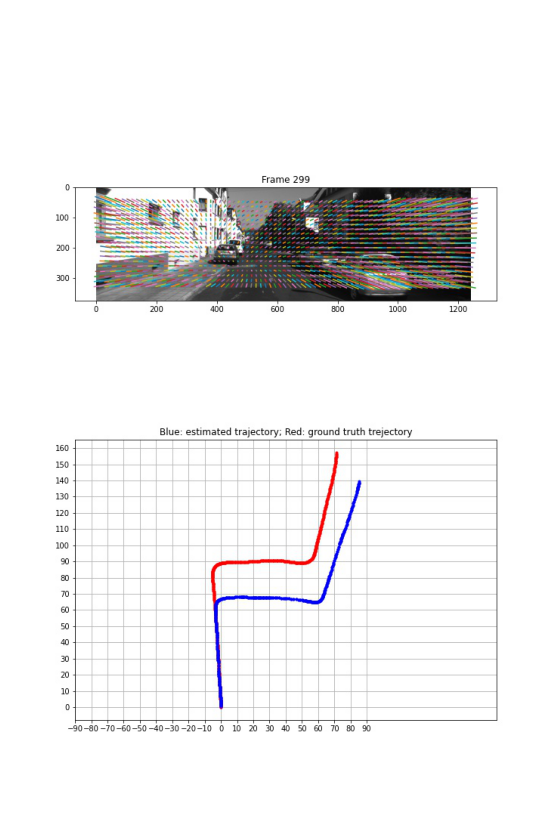

In [12]:
import runMatch
dataset_path = '/Users/QV/code-project/datasets/dataset_SfM'
feature_dir = 'Flow'
runMatch.runSFM(dataset_path, feature_dir )

1. Report the final rotation and translation error. **(2 points)**

SpyNet result:

Mean Error Rotation: 0.00444

Mean Error Translation: 0.59983

libviso2 result

Mean Error Rotation: 0.00299

Mean Error Translation: 0.53948


Next, answer the following questions:

2. Does SPyNet yield higher accuracy than the original $\mathtt{libviso2}$? Why or why not? If not, what steps can you take to improve? **(5 points)**

SPyNET yields worse results compared to libvisio2 when comparing in terms of both rotation and translation. This is despite SPyNET having many more matched correspondence compared to libvisio2.

SPyNET:

Matches 1463, Inliers: 89.00

libviso2:

Matches 295, Inliers: 85.42

By looking at the visualization of estimation using SPyNET correspondence compared with the ground truth. We can see that there is significant drift in using SPyNET as compared to using libvisio2. As explained in the libvisio2 paper, this is due to bias in the correspondence, such as belonging to the same objects on screen. Further investigation is needed to determine if this is really the root cause of the drift in SPyNET. If it is, then we can use the same bucket processing steps in libvisio2 to alleviate the drift.

3. Explain how SPyNet achieves accurate flow with significantly lower computational cost. **(3 points)**

SPyNet only predicts the residual flow field in each upsampling stage. Since this is a much simpler task compared to predicting the flow directly, they can use a network with smaller capacity to learn it, leading to much fewer trainable parameters and lower computational cost.

## Question 5: Using Sfm-learner for SFM
Now we will use deep neural networks for SFM. Please follow the open-source Sfmlearner repository (https://github.com/ClementPinard/SfmLearner-Pytorch) and the paper (https://people.eecs.berkeley.edu/~tinghuiz/projects/SfMLearner/cvpr17_sfm_final.pdf) to answer the following questions.

1. Describe how photometric loss is implemented in Sfmlearner? Please refer to the paper and the code. **(5 points)**

The photometric loss is used to train the CNNs in the paper.

Given a sequence of images I_1, ..., I_N, we can choose one image as the target image and the nearby images as the source images.

A depth network takes as input the depth image and outputs per-pixel depth map. A pose network takes both the target and source images as input and outputs the relative camera poses. The camera poses, depth image and given camera intrinsic are used to inverse warp the source images to reconstruct the target images.

The photometric loss is then the sum of the per-pixel norm difference between the target image and the reconstructed target images.

We can also choose different images in I_1, ..., I_N to be the target image and sum over the per-target image photometric loss to obtain a photometric loss for the entire sequence of images.

2. Train the model and show the training curve, validation curve, and visualization of predicted depth and warped images? Which loss is decreasing and which is increasing? Why? **(10 points)**

 Visualize the specific images: `val_Depth_Output_Normalized/0`, `val_Warped_Outputs/0` from tensorboard.
 
 Training data: 
`/datasets/cse152-252-sp20-public/sfmlearner_h128w416`.

#### Install the environment
`pip install -r requirements.txt`
- fix scipy version problem: 

`pip install scipy==1.1.0 --user`

#### Training script
`cd SfmLearner-Pytorch`

`python3 train.py /datasets/cse152-252-sp20-public/sfmlearner_h128w416 -b4 -m0.2 -s0.1 --epoch-size 3000 --sequence-length 3 --log-output`




In [11]:
%matplotlib inline 
import os 
import os.path as osp 
import matplotlib.pyplot as plt 
from IPython.display import Image
from IPython.core.display import HTML 

path = "SfmLearner-Pytorch/tb_img/"

for img_name in os.listdir(path):

    img_rel_path = osp.join(path, img_name)

    print(f"![{img_name}]({img_rel_path})")

![val_Warped_Outputs_0.png](SfmLearner-Pytorch/tb_img/val_Warped_Outputs_0.png)
![qns2_photometric_error.png](SfmLearner-Pytorch/tb_img/qns2_photometric_error.png)
![qns_2_total_loss.png](SfmLearner-Pytorch/tb_img/qns_2_total_loss.png)
![qns2_explainability_loss.png](SfmLearner-Pytorch/tb_img/qns2_explainability_loss.png)
![qns2_disparity_smoothness_loss.png](SfmLearner-Pytorch/tb_img/qns2_disparity_smoothness_loss.png)
![qns2_val_Depth_Output_Normalized_0.png](SfmLearner-Pytorch/tb_img/qns2_val_Depth_Output_Normalized_0.png)
![qns2_validation_total_loss.png](SfmLearner-Pytorch/tb_img/qns2_validation_total_loss.png)
![qns2_validation_exp_loss.png](SfmLearner-Pytorch/tb_img/qns2_validation_exp_loss.png)
![qns2_validation_photo_loss.png](SfmLearner-Pytorch/tb_img/qns2_validation_photo_loss.png)




![val_Warped_Outputs_0.png](SfmLearner-Pytorch/tb_img/val_Warped_Outputs_0.png)
![qns2_photometric_error.png](SfmLearner-Pytorch/tb_img/qns2_photometric_error.png)
![qns_2_total_loss.png](SfmLearner-Pytorch/tb_img/qns_2_total_loss.png)
![qns2_explainability_loss.png](SfmLearner-Pytorch/tb_img/qns2_explainability_loss.png)
![qns2_disparity_smoothness_loss.png](SfmLearner-Pytorch/tb_img/qns2_disparity_smoothness_loss.png)
![qns2_val_Depth_Output_Normalized_0.png](SfmLearner-Pytorch/tb_img/qns2_val_Depth_Output_Normalized_0.png)
![qns2_validation_total_loss.png](SfmLearner-Pytorch/tb_img/qns2_validation_total_loss.png)
![qns2_validation_exp_loss.png](SfmLearner-Pytorch/tb_img/qns2_validation_exp_loss.png)
![qns2_validation_photo_loss.png](SfmLearner-Pytorch/tb_img/qns2_validation_photo_loss.png)









The following losses are decreasing:

- Photometric error 

- Total loss 

- Explainability loss 

- Validation total loss 

- Validation Explainability loss 

These losses decrease because training is performed to minimize them. Their decreasing trend shows that there is no serious error in the code.

The following loss is increasing:

- Disparity smoothing loss 

The disparity loss is the L1 norm of the second-order gradients for the predicted depth maps. This is used to handle the local gradient issue. It makes sense that this loss increases as training progresses, which shows that the predicted depth map is heavily dependent on the input image. 

The following loss decreases and then increases:

- Validation Photometric loss

This shows that the model might have overfitting to the training data for minimizing the Photometric loss.

Note to self, not part of answer:

This is being run on nautilus on pod quan-sfm-qns2-q2dq2

The root directory is at /cephfs/quan/252c/cse252c_hw1/SfmLearner-Pytorch

=> will save everything to checkpoints/sfmlearner_h128w416,epoch_size3000,m0.2/05-01-22:09

3. When training the model, we use 3 consecutive frames. Now, you will use the photometric consistency between the 1st and the 3rd frame. To be more specific, you can get the pose $T_{1,3} = T_{2,3} @ T_{1,2}$, where $T_{1,2}, T_{2,3}$ have already been computed in the original code. Add the constraint to the total loss and report the results in the same manner as in part 2 above. **(10 points)**

In [13]:
%matplotlib inline 
import os 
import os.path as osp 
import matplotlib.pyplot as plt 
from IPython.display import Image
from IPython.core.display import HTML 

path = "SfmLearner-Pytorch-qns3/tb_img/"

for img_name in os.listdir(path):

    img_rel_path = osp.join(path, img_name)

    print(f"![{img_name}]({img_rel_path})")

![qns3_val_Warped_Outputs_0.png](SfmLearner-Pytorch-qns3/tb_img/qns3_val_Warped_Outputs_0.png)
![qns3_val_Depth_Output_Normalized.png](SfmLearner-Pytorch-qns3/tb_img/qns3_val_Depth_Output_Normalized.png)
![qns3_photometric_error.png](SfmLearner-Pytorch-qns3/tb_img/qns3_photometric_error.png)
![qns3_explainability_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_explainability_loss.png)
![qns3_validation_exp_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_validation_exp_loss.png)
![qns3_disparity_smoothness_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_disparity_smoothness_loss.png)
![qns3_total_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_total_loss.png)
![qns3_validation_photo_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_validation_photo_loss.png)
![qns3_validation_total_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_validation_total_loss.png)


![qns3_val_Warped_Outputs_0.png](SfmLearner-Pytorch-qns3/tb_img/qns3_val_Warped_Outputs_0.png)
![qns3_val_Depth_Output_Normalized.png](SfmLearner-Pytorch-qns3/tb_img/qns3_val_Depth_Output_Normalized.png)
![qns3_photometric_error.png](SfmLearner-Pytorch-qns3/tb_img/qns3_photometric_error.png)
![qns3_explainability_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_explainability_loss.png)
![qns3_validation_exp_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_validation_exp_loss.png)
![qns3_disparity_smoothness_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_disparity_smoothness_loss.png)
![qns3_total_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_total_loss.png)
![qns3_validation_photo_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_validation_photo_loss.png)
![qns3_validation_total_loss.png](SfmLearner-Pytorch-qns3/tb_img/qns3_validation_total_loss.png)





Generally, the trends in the loss are similar to those seen in question 2. However, the model seems to overfit more to the training data.

The following losses are decreasing:

- Photometric error 

- Total loss 

- Explainability loss 

- Validation total loss 

- Validation Explainability loss 

(Same reason as in question 2) These losses decrease because training is performed to minimize them. Their decreasing trend shows that there is no serious error in the code.

The following loss is increasing:

- Disparity smoothing loss 

(Same reason as in question 2)  The disparity loss is the L1 norm of the second-order gradients for the predicted depth maps. This is used to handle the local gradient issue. It makes sense that this loss increases as training progresses, which shows that the predicted depth map is heavily dependent on the input image. 

The following loss decreases and then increases:

- Validation Photometric loss

This shows that the model might have overfitting to the training data for minimizing the Photometric loss. However, the model overfits in fewer epochs compared to the original code in question 2.

Note to self, not part of answer:

This is running on pod quan-sfm-qns3-7jx4s

The root directory is /cephfs/quan/252c/SfmLearner-Pytorch-qns3

Result: checkpoints/sfmlearner_h128w416,epoch_size3000,m0.2/05-01-23:50


4. Now, you will evaluate your models from parts (2), (3) on the KITTI odometry dataset. What are the error metrics used in Sfm-learner? Please report the `ATE` and `RE` for sequence `09` and `10`. **(5 points)**

  Data: `/datasets/cse152-252-sp20-public/kitti`.

#### Evaluation script
`python3 test_pose.py /path/to/posenet --dataset-dir /datasets/cse152-252-sp20-public/kitti --sequences 09`

ATE is the Absolute Trajectory Error (ATE). ATE is computed on 5-frame snippets and averaged over the full sequence. It is the norm of the difference between the ground truth and the scaled prediction averaged over the snippet length.

RE measures the difference in terms of the rotational aspect of the ground truth pose and predicted pose.

MODEL FROM PART 2

SEQUENCE 09 

Command: python test_pose.py checkpoints/sfmlearner_h128w416\,epoch_size3000\,m0.2/05-01-22\:09/exp_pose_model_best.pth.tar --dataset-dir ../../dataset/kitti --sequence 09

Results
                ATE,         RE
                
mean         0.0120,     0.0021

std          0.0069,     0.0010

SEQUENCE 10

Command: python test_pose.py checkpoints/sfmlearner_h128w416\,epoch_size3000\,m0.2/05-01-22\:09/exp_pose_model_best.pth.tar --dataset-dir ../../dataset/kitti --sequence 10

Results
                ATE,         RE

mean         0.0092,     0.0021

std          0.0074,     0.0013

MODEL FROM PART 3

SEQUENCE 09

Command: python test_pose.py checkpoints/sfmlearner_h128w416\,epoch_size3000\,m0.2/05-01-23\:50/exp_pose_model_best.pth.tar --dataset-dir ../dataset/kitti --sequences 09

Results
                ATE,         RE

mean         0.0127,     0.0027

std          0.0080,     0.0017

SEQUENCE 10

Command: python test_pose.py checkpoints/sfmlearner_h128w416\,epoch_size3000\,m0.2/05-01-23\:50/exp_pose_model_best.pth.tar --dataset-dir ../dataset/kitti --sequences 10

Results
                ATE,         RE

mean         0.0119,     0.0029

std          0.0081,     0.0023

### Notes:
- scp data to local machines:

`scp -r <USERNAME>@dsmlp-login.ucsd.edu:/datasets/cse152-252-sp20-public/sfmlearner_h128w416.zip`

`scp -r <USERNAME>@dsmlp-login.ucsd.edu:/datasets/cse152-252-sp20-public/kitti.zip`
...
- tensorboard: open jupyter notebook from the link after `launch-scipy-ml-gpu.sh`. Click new `Tensorboard ..`

``answer here``

# References
1. Daniel DeTone, Tomasz Malisiewicz, and Andrew Rabinovich. Superpoint: Self-supervised interest point detection and description. In Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition Workshops, pages 224–236, 2018.
2. Andreas Geiger, Philip Lenz, and Raquel Urtasun. Are we ready for autonomous driving? the kitti vision benchmark suite. In Conference on Computer Vision and Pattern Recognition (CVPR), 2012.
3. Andreas Geiger, Julius Ziegler, and Christoph Stiller. Stereoscan: Dense 3d reconstruction in real-time. In Intelligent Vehicles Symposium (IV), 2011.
4. David G Lowe. Distinctive image features from scale-invariant keypoints. IJCV, 60(2):91–110, 2004.
5. Anurag Ranjan and Michael J Black. Optical flow estimation using a spatial pyramid network. In
Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition, pages 4161–4170, 2017.
6. A. Vedaldi and B. Fulkerson. VLFeat: An open and portable library of computer vision algorithms. http://www.vlfeat.org/, 2008.
7. Lucas, Bruce D., and Takeo Kanade. "An iterative image registration technique with an application to stereo vision." (1981): 674.
8. B. Kitt, A. Geiger, and H. Lategahn, “Visual odometry based on stereo image sequences with RANSAC-based outlier rejection scheme,” in 2010 IEEE Intelligent Vehicles Symposium, La Jolla, CA, USA, Jun. 2010, pp. 486–492, doi: 10.1109/IVS.2010.5548123.
9. A. Geiger, J. Ziegler, and C. Stiller, “StereoScan: Dense 3d reconstruction in real-time,” in 2011 IEEE Intelligent Vehicles Symposium (IV), Baden-Baden, Germany, Jun. 2011, pp. 963–968, doi: 10.1109/IVS.2011.5940405.